# Overview of the whole analysis

**Initialization**

In [1]:
# import packages
import os
import sys
import numpy as np
import pandas as pd
import pcntoolkit
import seaborn as sns
import pickle
import glob
import shutil
import matplotlib.pyplot as plt
import nilearn.plotting as plotting
from matplotlib.colors import ListedColormap

import pingouin as pg
import scipy.stats as stats
import nilearn.plotting as plotting
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import xarray as xr
from glob import glob

# custom functions
code_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/code')
os.chdir(code_dir)
import clinics_desc_functions as custom

model_name, site_names, site_ids_tr, idp_ids = custom.pretrained_ini()

pk = sns.color_palette("RdBu_r", 20)

pk1 = pk[0:10]
pk2 = pk[10:]
ColdHot = ListedColormap([*pk1,*pk2])

pk1.reverse()
pk2.reverse()

ColdHot_r = ListedColormap([*pk1,*pk2])

new_palette = ['#FFFFFF', '#FBFCF4', '#F6F9E9', '#F2F6DE', '#EDF3D3', '#E9F0C8', '#E4EDBD', '#E0EAB2', '#DCE8A7', '#D7E59B', '#D3E290', '#CEDF85', '#CADC7A', '#C5D96F', '#C1D664', '#BCD359', '#B8D04E', '#B3CE56', '#ADCD5E', '#A8CB66', '#A3C96E', '#9DC776', '#98C67E', '#93C486', '#8EC28F', '#88C097', '#83BF9F', '#7EBDA7', '#78BBAF', '#73B9B7', '#6EB8BF', '#68B6C7', '#63B4CF', '#64AFCC', '#65ABC8', '#66A6C5', '#66A2C1', '#679DBE', '#6898BA', '#6994B7', '#6A8FB3', '#6B8BB0', '#6C86AC', '#6D81A9', '#6D7DA5', '#6E78A2', '#6F749E', '#706F9B', '#786D9A', '#806C99', '#886A99', '#906998', '#986797', '#A06596', '#A86495', '#B16294', '#B96094', '#C15F93', '#C95D92', '#D15C91', '#D95A90', '#E15890', '#E9578F', '#F1558E']
new_palette = ListedColormap(new_palette, 'indexed')

poster_reds = ['#E9E9E9', '#FDECF2', '#FCD9E6', '#FAC6D9', '#F9B4CD', '#F7A1C0', '#F68EB4', '#F47BA7', '#F3689B', '#F1558E', '#F04282', '#EE2F75', '#ED1D69', '#D81159']
poster_reds = ListedColormap(poster_reds, 'indexed')
poster_reds_r = ListedColormap(poster_reds.colors[::-1])

poster_blues_r = ['#218380', '#25938F', '#29A39F', '#2DB4AF', '#31C4BF', '#3BCEC9', '#5CD6D2', '#7CDEDB', '#9DE7E4', '#ADEBE9', '#BEEFED', '#CEF3F2', '#DEF7F6', '#E9E9E9']
poster_blues_r = ListedColormap(poster_blues_r, 'indexed')
poster_blues = ListedColormap(poster_blues_r.colors[::-1])

poster_blue_pink_palette = ListedColormap([  '#FFFFFF', '#FDECF2', '#FCD9E6', '#FAC6D9', '#F9B4CD', '#F7A1C0', '#F68EB4', '#F47BA7', '#F3689B', '#F1558E', '#F04282', '#EE2F75', '#ED1D69', '#D81159',
                    '#218380', '#25938F', '#29A39F', '#2DB4AF', '#31C4BF', '#3BCEC9', '#5CD6D2', '#7CDEDB', '#9DE7E4', '#ADEBE9', '#BEEFED', '#CEF3F2', '#DEF7F6', '#FFFFFF'])

poster_blue_pink_palette_r = ListedColormap([*poster_blues.colors,*poster_reds_r.colors])
poster_blue_pink_palette_normal = ListedColormap([*poster_blues_r.colors,*poster_reds.colors])


/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/datasets/__init__.py:93: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.0, the latest is 0.5.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


**Define paths**

In [2]:
# Where things are
project_dir = ('/home/barbora/Documents/Projects/Normative_Models')
pretrained_dir = os.path.join(project_dir,'ESO', 'braincharts')
#models_dir = os.path.join(project_dir,'ESO', 'models', 'pretrained_long_adapt_experiment', 'controls_adaptation')
data_dir = os.path.join(project_dir,'ESO', 'models', 'sensitivity', 'data')
#images_dir = os.path.join(project_dir, 'ESO', 'models','diff_variance','img')
#os.makedirs(images_dir, exist_ok=True)
paper_im_dir = os.path.join(project_dir,'ESO', 'draft', 'img')
os.makedirs(paper_im_dir, exist_ok=True)

__________________________________

#### **The very basic dataset description -- before the QC**

In [6]:
# The very basic description of the raw data (before QC)
raw_data = pd.read_csv(os.path.join(data_dir, 'all_cs_thickness.csv'), index_col=0, sep=' ')
print(raw_data.loc[raw_data['visit']==1][['sex','age','category','diagnosis']].groupby(['category', 'sex']).agg(['count', 'mean','median', 'min', 'max', 'std']))

               age                                             
             count       mean  median     min     max       std
category sex                                                   
Control  0      43  30.183488  27.339  18.385  53.919  9.933656
         1      26  29.843269  30.512  20.667  39.377  5.105514
Patient  0      39  29.276846  27.783  18.597  45.925  7.713012
         1      63  26.877540  26.243  18.052  42.824  6.537531


In [119]:
# The very basic description of the data after cleaning
clean_data = pd.read_csv(os.path.join(data_dir, 'all_cs_thickness_qc.csv'), index_col=0, sep=' ')
print(clean_data.loc[clean_data['visit']==1][['sex','age','category','length_of_symptoms','length_of_disease']].groupby(['category','sex']).agg(['count', 'median', 'min', 'max']))
print('\n')
print(clean_data.loc[clean_data['visit']==1][['sex','age','category','length_of_symptoms','length_of_disease']].groupby(['category']).agg(['count', 'median', 'min', 'max']))

               age                          length_of_symptoms              \
             count   median     min     max              count median  min   
category sex                                                                 
Control  0      42  27.4900  18.385  53.919                  0    NaN  NaN   
         1      25  30.3580  20.667  39.377                  0    NaN  NaN   
Patient  0      38  28.1205  18.597  45.925                 38    1.0  0.0   
         1      60  26.1685  18.052  42.824                 59    1.0  0.0   

                   length_of_disease                    
               max             count median  min   max  
category sex                                            
Control  0     NaN                 0    NaN  NaN   NaN  
         1     NaN                 0    NaN  NaN   NaN  
Patient  0    18.0                38    3.5  1.0  21.0  
         1    16.0                60    4.5  1.0  19.0  


           sex                  age                 

--------------------------------------------------
### **Prepare Z-scores using BLR normative models based only on local controls**

In [3]:
from BLR_standalone import analysis_blr_standalone
patients, controls = analysis_blr_standalone(only_load=0, preproc='cs')

Random seed 42 has been set.
1
Creating basis expansion for ROI: lh_G&S_frontomargin_thickness
Processing data in /home/barbora/Documents/Projects/Normative_Models/ESO/models/full_analysis/standalone_blr_cs/V1/lh_G&S_frontomargin_thickness/resp_ad.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Optimization terminated successfully.
         Current function value: -19.050041
         Iterations: 3
         Function evaluations: 95
Saving model meta-data...
Evaluating the model ...
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Creating basis expansion for ROI: lh_G&S_occipital_inf_thickness
Processing data in /home/barbora/Documents/Projects/Normative_Models/ESO/models/full_analysis/standalone_blr_cs/V1/lh_G&S_occipital_inf_thickness/resp_ad.txt
Estimati

/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/pcntoolkit/model/bayesreg.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=2.80198e-19): result may not be accurate.
  invAXt = linalg.solve(self.A, X.T, check_finite=False)


Processing data in /home/barbora/Documents/Projects/Normative_Models/ESO/models/full_analysis/standalone_blr_cs/V1/lh_G_Ins_lg&S_cent_ins_thickness/resp_ad.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Optimization terminated successfully.
         Current function value: 6.824468
         Iterations: 3
         Function evaluations: 75
Saving model meta-data...
Evaluating the model ...
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Creating basis expansion for ROI: lh_G_insular_short_thickness
Processing data in /home/barbora/Documents/Projects/Normative_Models/ESO/models/full_analysis/standalone_blr_cs/V1/lh_G_insular_short_thickness/resp_ad.txt
Estimating model  1 of 1
configuring BLR ( order 1 )
Using default hyperparameters
Optimization terminated

KeyboardInterrupt: 

--------------------------------------------------
### **Prepare Z-scores using pretrained models**
- either run models or load and create the xarray structure
- For the training of the models, see "pretrained_long_adapt.py"

In [3]:
from pretrained_long_adapt import analysis_pretrained_adapt_controls
long_patients, long_controls = analysis_pretrained_adapt_controls(only_load=1, preproc='long', test_size=0.5)
cs_patients, cs_controls = analysis_pretrained_adapt_controls(only_load=1, preproc='cs', test_size=0.5)

Random seed 42 has been set.


----------------------------------------------------------------------------------------------------------------------------------------

### Difference in preprocessing

compute difference 

In [4]:
# patients' differende
cs_pat_diff = (cs_patients.sel(preproc='z_orig', visit='v2').features - cs_patients.sel(preproc='z_orig', visit='v1').features).to_dataframe().reset_index()
cs_pat_diff['preprocessing'] = 'cs'
long_pat_diff = (long_patients.sel(preproc='z_orig', visit='v2').features - long_patients.sel(preproc='z_orig', visit='v1').features).to_dataframe().reset_index()
long_pat_diff['preprocessing'] = 'long'

pat_diff = pd.concat([cs_pat_diff, long_pat_diff], axis=0)
pat_diff = pat_diff.reset_index()

# controls' differende
cs_cont_diff = (cs_controls.sel(preproc='z_orig', visit='v2').features - cs_controls.sel(preproc='z_orig', visit='v1').features).to_dataframe().reset_index()
cs_cont_diff['preprocessing'] = 'cs'
long_cont_diff = (long_controls.sel(preproc='z_orig', visit='v2').features - long_controls.sel(preproc='z_orig', visit='v1').features).to_dataframe().reset_index()
long_cont_diff['preprocessing'] = 'long'

cont_diff = pd.concat([cs_cont_diff, long_cont_diff], axis=0)
cont_diff = cont_diff.reset_index()

plotting

No handles with labels found to put in legend.


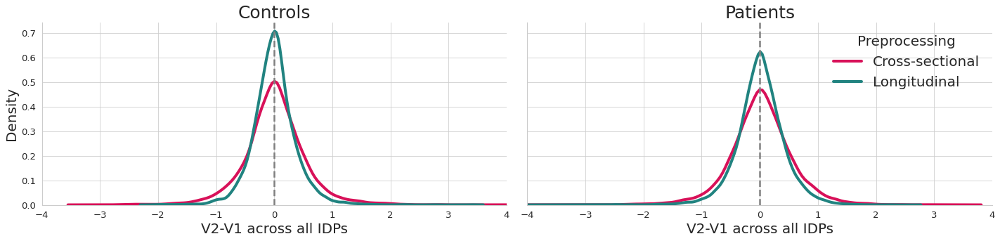

In [5]:
# Plot the difference between the visits

sns.set_theme(style='whitegrid')
sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2.5})

#cobra_colors = ["#D81159","#218380", "#FFDD00"]
preproc_colors = ['#218380','#D81159']
# Set your custom color palette
cobra_colors = sns.set_palette(sns.color_palette(preproc_colors))

fig, ax = plt.subplots(1,2,figsize=(20,5), sharey=True)
sns.kdeplot(data=cont_diff, x='features', hue='preprocessing', ax=ax[0], linewidth=4, hue_order=['long', 'cs'])
ax[0].set_xlabel('V2-V1 across all IDPs',fontsize=20)
ax[0].set_ylabel('Density',fontsize=20)
ax[0].set_title('Controls', fontsize=25)
ax[0].legend(frameon=False)
ax[0].axvline(0, color='grey', linestyle='--')
ax[0].set(xlim=(-4,4))

sns.kdeplot(data=pat_diff, x='features', hue='preprocessing', ax=ax[1], linewidth=4, hue_order=['long','cs'])
ax[1].set_xlabel('V2-V1 across all IDPs',fontsize=20)
ax[1].set_title('Patients', fontsize=25)
#ax[1].legend(frameon=False)
ax[1].legend(title='Preprocessing', loc='upper right', labels=['Cross-sectional','Longitudinal'], frameon=False, fontsize=20, title_fontsize=20)
ax[1].axvline(0, color='grey', linestyle='--')
ax[1].set(xlim=(-4,4))

plt.tight_layout()
sns.despine()
plt.savefig(os.path.join(paper_im_dir, 'preprocessing_diff.png'), dpi=100, transparent=True)

F-test of variances

In [6]:
# perform F-test

# define f-test
import scipy.stats
# F test
def f_test(group1, group2):
    f = np.var(group1, ddof=1)/np.var(group2, ddof=1)
    nun = group1.size-1
    dun = group2.size-1
    p_value = 1-scipy.stats.f.cdf(f, nun, dun)
    return f, p_value

f, pval = f_test(cont_diff.loc[cont_diff['preprocessing']=='cs', 'features'].to_numpy(), 
        cont_diff.loc[cont_diff['preprocessing']=='long', 'features'].to_numpy())

print('F-test for controls: F = {:.2f}, p = {:.4f}'.format(f, pval))

f, pval = f_test(pat_diff.loc[pat_diff['preprocessing']=='cs', 'features'].to_numpy(), 
        pat_diff.loc[pat_diff['preprocessing']=='long', 'features'].to_numpy())

print('F-test for patients: F = {:.2f}, p = {:.4f}'.format(f, pval))

f, pval = f_test(cont_diff.loc[cont_diff['preprocessing']=='long', 'features'].to_numpy(), 
        pat_diff.loc[pat_diff['preprocessing']=='long', 'features'].to_numpy())

print('F-test for patients: F = {:.2f}, p = {:.4f}'.format(f, pval))

F-test for controls: F = 2.15, p = 0.0000
F-test for patients: F = 1.80, p = 0.0000
F-test for patients: F = 0.81, p = 1.0000


In [7]:
# heatmap of the difference between the visits across controls based on preprocessing
# corr-sectional
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(cs_cont_diff.groupby('roi').agg('mean'), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmin=-0.2, vmax=0.2).save_as_html(os.path.join(paper_im_dir, 'diff_cs_controls_r.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(cs_cont_diff.groupby('roi').agg('mean'), hemi='l', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmin=-0.2, vmax=0.2).save_as_html(os.path.join(paper_im_dir, 'diff_cs_controls_l.html'))

# longitudinal
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(long_cont_diff.groupby('roi').agg('mean'), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmin=-0.2, vmax=0.2).save_as_html(os.path.join(paper_im_dir, 'diff_long_controls_r.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(long_cont_diff.groupby('roi').agg('mean'), hemi='l', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmin=-0.2, vmax=0.2).save_as_html(os.path.join(paper_im_dir, 'diff_long_controls_l.html'))

NameError: name 'poster_blue_pink_palette_r' is not defined

------------------------------------------------------------------------------------------------------------------------------------------------

## Cross-sectional results

In [83]:
from pingouin import wilcoxon, ttest
import statsmodels as sm
import statsmodels.api as sm
import statsmodels as sm

thick_idp = [idp for idp in idp_ids if 'thick' in idp]

v1 = long_patients.sel(visit='v1', preproc='z_orig').features.to_pandas()
v2 = long_patients.sel(visit='v2', preproc='z_orig').features.to_pandas()

results = np.empty((len(thick_idp)*2))
results_pol = np.empty((len(thick_idp)*2))
visit = np.array([np.ones((len(thick_idp))), np.ones((len(thick_idp)))*2]).flatten()
j=0

for ivisit in ['v1', 'v2']:
    if ivisit == 'v1':
        to_an = v1
    else:
        to_an = v2

    for iidp, idp in enumerate(thick_idp):
        
        # perform wilcoxon test
        pk = wilcoxon(to_an[idp], alternative='two-sided')
        results[j] = pk['p-val'].values
        results_pol[j] = to_an[idp].mean()
        j+=1

to_plot = pd.DataFrame({'p-value': results, 'polarity':results_pol, 'visit': visit, 'IDP': np.array(thick_idp*2)})
to_plot1 = to_plot.loc[to_plot['visit']==1, :]
to_plot1.index = to_plot1['IDP']
# Compute Benjamini-Hochenberg correction
correction = sm.stats.multitest.multipletests(to_plot1['p-value'], alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)
to_plot1['pval_corr_bool'] = correction[0]
to_plot1['pval_corr'] = correction[1]
to_plot1['pval_pol'] = to_plot1['pval_corr']*to_plot1['polarity']

to_plot2 = to_plot.loc[to_plot['visit']==2, :]
to_plot2.index = to_plot2['IDP']
# Compute Benjamini-Hochenberg correction
correction = sm.stats.multitest.multipletests(to_plot2['p-value'], alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)
to_plot2['pval_corr_bool'] = correction[0]
to_plot2['pval_corr'] = correction[1]
to_plot2['pval_pol'] = to_plot2['pval_corr']*to_plot2['polarity']

/tmp/ipykernel_13111/2401269121.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  to_plot1['pval_corr_bool'] = correction[0]
/tmp/ipykernel_13111/2401269121.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  to_plot1['pval_corr'] = correction[1]
/tmp/ipykernel_13111/2401269121.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-do

In [110]:
# This will plot the number of patients with extreme values
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(pd.DataFrame((abs(v1)>1.96).sum(), columns=['v1'])['v1'] * pd.DataFrame(np.sign(v1.mean()), columns=['polarity'])['polarity'], columns=['val']), hemi='l', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc)


/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '


In [112]:
# these are corrected pvalues 
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(to_plot1['pval_pol']), hemi='l', method='pvals')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmax=0.075, vmin=-0.075).save_as_html(os.path.join(paper_im_dir, 'v1_wilcoxn_l.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(to_plot1['pval_pol']), hemi='r', method='pvals')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmax=0.075, vmin=-0.075).save_as_html(os.path.join(paper_im_dir, 'v1_wilcoxn_r.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(to_plot2['pval_pol']), hemi='l', method='pvals')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmax=0.075, vmin=-0.075).save_as_html(os.path.join(paper_im_dir, 'v2_wilcoxn_l.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(to_plot2['pval_pol']), hemi='r', method='pvals')
plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc, vmax=0.075, vmin=-0.075).save_as_html(os.path.join(paper_im_dir, 'v2_wilcoxn_r.html'))


/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')


---------------------------------------------------------------------------------------------------
### Compute deviations

In [114]:
# Compute the difference between the visits
#idp_ids = idp_ids[:-1]

ESO_diff = ((long_patients.sel(roi=idp_ids, visit='v2', preproc='y_orig').features - long_patients.sel(roi=idp_ids, visit='v2', preproc='yhat_orig').features
) - (
    long_patients.sel(roi=idp_ids, visit='v1', preproc='y_orig').features - long_patients.sel(roi=idp_ids, visit='v1', preproc='yhat_orig').features))

ESO_diff = ESO_diff.to_pandas()

In [115]:
# Load test-retest variance
test_retest_variance = pd.read_csv(os.path.join(project_dir, 'COINS', 'models','HBR','NUDZ_test_retest_variance.csv'), sep=' ', index_col=0)
test_retest_variance = test_retest_variance.T

NameError: name 'ESO_diff_z' is not defined

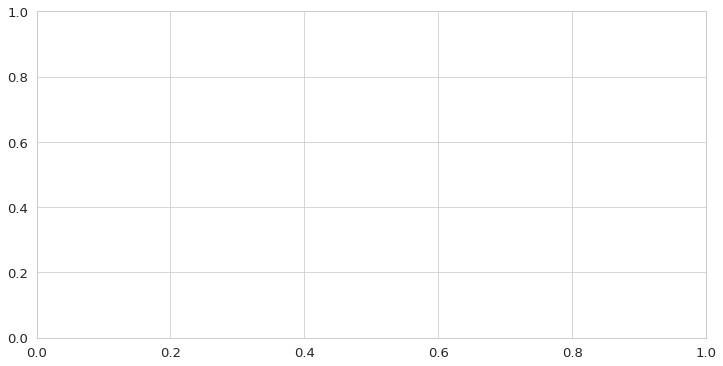

In [116]:
# Sanity check, whether everything looks "normal"
fig, ax = plt.subplots(1,1,figsize=(12,6))
sns.heatmap(ESO_diff_z[thick_id], cmap='RdBu_r', vmax=4, vmin=-4)

In [119]:
# Computue the test-retest based z-score
import statsmodels as sm

ESO_diff_z = ESO_diff[thick_idp]

# Z-scores
for iidp, idp in enumerate(thick_idp):
    ESO_diff_z[idp] = ESO_diff_z[idp]/(2*test_retest_variance[idp].to_numpy())

# Wilcoxon test of weather the "median" z-score is significantly different from zero
res = np.empty((len(thick_idp), 2))
for i, idp in enumerate(thick_idp):
    temp = stats.wilcoxon(ESO_diff_z[idp])
    res[i,0] = temp[0]
    res[i,1] = temp[1]

res = pd.DataFrame(res, index=thick_idp, columns=['W', 'pval'])

# Compute Benjamini-Hochenberg correction of 
correction = sm.stats.multitest.multipletests(res['pval'], alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)
res['pval_corr'] = correction[1]
res['pval_corr_sig'] = correction[0]

# Add the mean IDP diff-z
res = pd.concat([res, ESO_diff_z[thick_idp].median()], axis=1)
res.columns = ['W', 'pval', 'pval_corr', 'pval_corr_sig', 'median_z']

/tmp/ipykernel_13111/3987522807.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ESO_diff_z[idp] = ESO_diff_z[idp]/(2*test_retest_variance[idp].to_numpy())


In [309]:
# plot the variance across the ROIs
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(res['pval_corr']), hemi='r', method='pvals')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmax = 0.075, cmap=poster_reds_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_idp_r.html'))

# plot the variance across the ROIs
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(res['pval_corr']), hemi='l', method='pvals')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmax = 0.075, cmap=poster_reds_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_idp_l.html'))


/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '


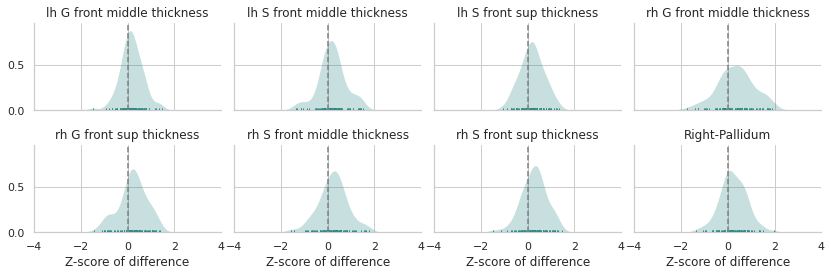

In [343]:
to_plot = pd.DataFrame(ESO_diff_z[res.loc[res['pval_corr_sig']==True].index].stack())
to_plot['roi'] = to_plot.index.get_level_values(1)
to_plot.columns = ['z', 'roi']

sns.set_context('paper')
sns.set_theme(style='whitegrid')
fig = sns.displot(data=to_plot, x="z", col="roi", kind="kde", col_wrap=4, rug=True, fill=True, common_norm=False, height=2, aspect=1.5, legend=False, linewidth=0, color=poster_blues_r.colors[0])
for i,idp in enumerate(res.loc[res['pval_corr_sig']==True].index):
    fig.axes[i].axvline(0, color='grey', linestyle='--')
    #fig.axes[i].set(xlim=(-4,4))
    fig.axes[i].set_xlabel('Z-score of difference')
    fig.axes[i].set_ylabel('')
    fig.axes[i].set_title(idp.replace('_', ' '))
    if 'thick' in idp:
        fig.axes[i].set_xlim(-4,4)

#poster_blues_r = ['#218380', '#25938F', '#29A39F', '#2DB4AF', '#31C4BF', '#3BCEC9', '#5CD6D2', '#7CDEDB', '#9DE7E4', '#ADEBE9', '#BEEFED', '#CEF3F2', '#DEF7F6', '#E9E9E9']

plt.savefig(os.path.join(paper_im_dir, 'significant_diffs.png'), dpi=300, bbox_inches='tight')


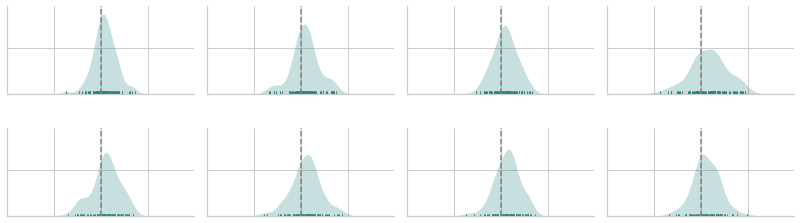

In [571]:
to_plot = pd.DataFrame(ESO_diff_z[res.loc[res['pval_corr_sig']==True].index].stack())
to_plot['roi'] = to_plot.index.get_level_values(1)
to_plot.columns = ['z', 'roi']

sns.set_context('paper')
sns.set_theme(style='whitegrid')
fig = sns.displot(data=to_plot, x="z", col="roi", kind="kde", col_wrap=4, rug=True, fill=True, common_norm=False, height=2, aspect=1.5, legend=False, linewidth=0, color=poster_blues_r.colors[0])
for i,idp in enumerate(res.loc[res['pval_corr_sig']==True].index):
    fig.axes[i].axvline(0, color='grey', linestyle='--')
    #fig.axes[i].set(xlim=(-4,4))
    fig.axes[i].set_xlabel('')
    fig.axes[i].set_ylabel('')
    fig.axes[i].set_title('')
    fig.axes[i].set_yticklabels([])
    fig.axes[i].set_xticklabels([])
    if 'thick' in idp:
        fig.axes[i].set_xlim(-4,4)

#poster_blues_r = ['#218380', '#25938F', '#29A39F', '#2DB4AF', '#31C4BF', '#3BCEC9', '#5CD6D2', '#7CDEDB', '#9DE7E4', '#ADEBE9', '#BEEFED', '#CEF3F2', '#DEF7F6', '#E9E9E9']

plt.savefig(os.path.join(paper_im_dir, 'significant_diffs_nolegend.png'), dpi=300, bbox_inches='tight')


In [519]:
sigroi = res.loc[res['pval_corr_sig']==True].index
indices = [ij for i in sigroi for ij, j in enumerate(idp_ids) if i in j]

In [581]:
i = 6
to_plot = pd.DataFrame(np.zeros([len(idp_ids),1]), columns=['z'])
to_plot.index = idp_ids
to_plot.loc[idp_ids[indices[i]], 'z'] = 1

print(idp_ids[indices[i]])
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(to_plot, hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, vmin = 0, vmax = 1, cmap=poster_reds, bg_map=fs_sulc)



rh_S_front_sup_thickness


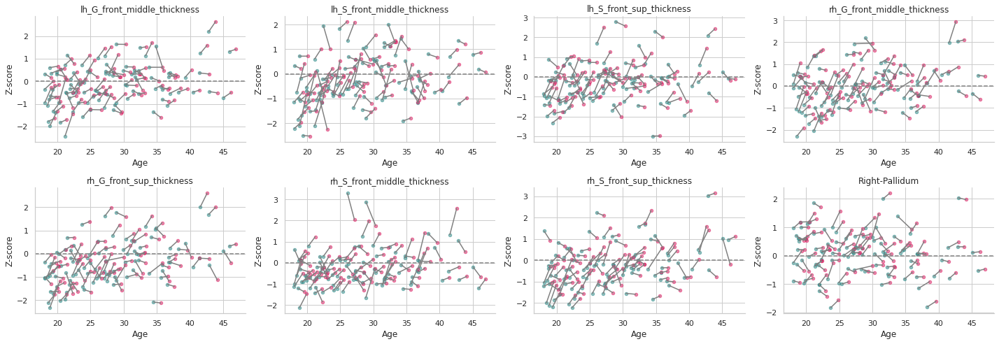

In [353]:
fig, ax = plt.subplots(2,4, figsize=(20,7))

for iplot, idp in enumerate(res.loc[res['pval_corr_sig']==True].index):

    ax.flatten()[iplot] = plot_longitudinal(long_patients.sel(visit='v1').clinics.sel(var='age').to_numpy(), 
                        long_patients.sel(visit='v2').clinics.sel(var='age').to_numpy(),
                        long_patients.sel(visit='v1', roi=idp, preproc='z_orig').features.to_numpy(),
                        long_patients.sel(visit='v2', roi=idp, preproc='z_orig').features.to_numpy(),
                        v1_col=poster_blues_r.colors[0], v2_col=poster_reds_r.colors[0],
                        fig=fig, ax=ax.flatten()[iplot])
    ax.flatten()[iplot].set_title(idp)
    ax.flatten()[iplot].set_xlabel('Age')
    ax.flatten()[iplot].set_ylabel('Z-score')
    ax.flatten()[iplot].axhline(0, color='grey', linestyle='--')
    sns.despine(fig=fig, ax=ax.flatten()[iplot])
    fig.tight_layout()

plt.savefig(os.path.join(paper_im_dir, 'significant_diffs_scatter.png'), dpi=300, bbox_inches='tight')


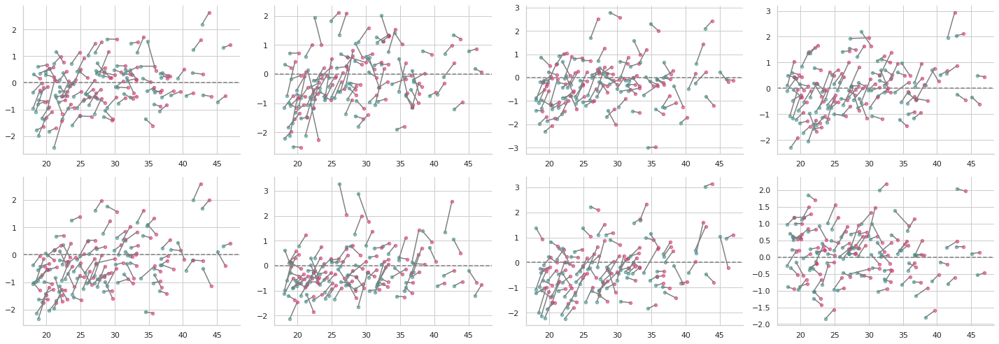

In [572]:
fig, ax = plt.subplots(2,4, figsize=(20,7))

for iplot, idp in enumerate(res.loc[res['pval_corr_sig']==True].index):

    ax.flatten()[iplot] = plot_longitudinal(long_patients.sel(visit='v1').clinics.sel(var='age').to_numpy(), 
                        long_patients.sel(visit='v2').clinics.sel(var='age').to_numpy(),
                        long_patients.sel(visit='v1', roi=idp, preproc='z_orig').features.to_numpy(),
                        long_patients.sel(visit='v2', roi=idp, preproc='z_orig').features.to_numpy(),
                        v1_col=poster_blues_r.colors[0], v2_col=poster_reds_r.colors[0],
                        fig=fig, ax=ax.flatten()[iplot])
    ax.flatten()[iplot].set_title('')
    ax.flatten()[iplot].set_xlabel('')
    ax.flatten()[iplot].set_ylabel('')
    ax.flatten()[iplot].axhline(0, color='grey', linestyle='--')
    sns.despine(fig=fig, ax=ax.flatten()[iplot])
    fig.tight_layout()

plt.savefig(os.path.join(paper_im_dir, 'significant_diffs_scatter_nolegend.png'), dpi=300, bbox_inches='tight')


In [340]:
# temporaty plot longitufinal function
def plot_longitudinal(v1_age, v2_age,  v1_Yhat, v2_Yhat, to_plot = True, v1_col='lightblue', v2_col='lightcoral', tick_col = 'gray', title = '', xlabel = 'Age', ylabel = 'Yhat', fig=None, ax=None, iplot=0):
    """
    The function will plot the longitudinal data as connected dots
    plot_longitudinal(v1_age, v2_age,  v1_Yhat, v2_Yhat, to_plot = True, v1_col='lightblue', v2_col='lightcoral', tick_col = 'gray', title = '', xlabel = 'Age', ylabel = 'Yhat')
    
    v1_age, v2_age... what will be plotted on x axis, ideally 1xn 2D array
    v1_Yhat, v2_Yhat... what will be plotted on y axis, ideally 1xn 2D array
    to_plot... if True, the plot will be shown, if False, the plot will be returned
    v1_col, v2_col, tick_col... color of the dots for the first and second visit
    title, xlabel, ylabel... title and labels of the plot
    """
    def check_dimensions(vector):
        """
        check_dimensions(vector)
        reshapes array into 2D 1xn array
        """
        if len(vector.shape) == 1:
            return vector[np.newaxis,:]
        elif len(vector.shape) == 2:
            if vector.shape[0] > vector.shape[1]:
                return vector.T
            else:
                return vector
        else:
            return False

    v1_age = check_dimensions(v1_age)
    v2_age = check_dimensions(v2_age)
    v1_Yhat = check_dimensions(v1_Yhat)
    v2_Yhat = check_dimensions(v2_Yhat)
    
    x_coords = np.concatenate([v1_age, v2_age],axis=0)
    y_coords = np.concatenate([v1_Yhat, v2_Yhat],axis=0)

    if to_plot:
        if fig is None:
            fig, ax = plt.subplots(1,1, figsize=(5,5))
        
        ax.plot(x_coords, y_coords, color=tick_col)
        ax.scatter(v1_age, v1_Yhat, color=v1_col, s=20, alpha = 0.5)
        ax.scatter(v2_age, v2_Yhat, color=v2_col, s=20, alpha = 0.5)

    return ax


\#TODO -- fancify the labels

In [225]:
idp_fancy = pd.read_table(os.path.join(project_dir, 'freesurfer_fancy_names.txt'), sep='\t', index_col=0)


fancy_short = list(idp_fancy['Short'])
fancy_short = [idp.replace('_and_', '&') for idp in fancy_short]
[print(i) for i, idp in enumerate(idp_ids) if fancy_short[0] in idp]

In [245]:
thick_id = [i for i in idp_ids if 'thick' in i]

<AxesSubplot:xlabel='roi', ylabel='subject'>

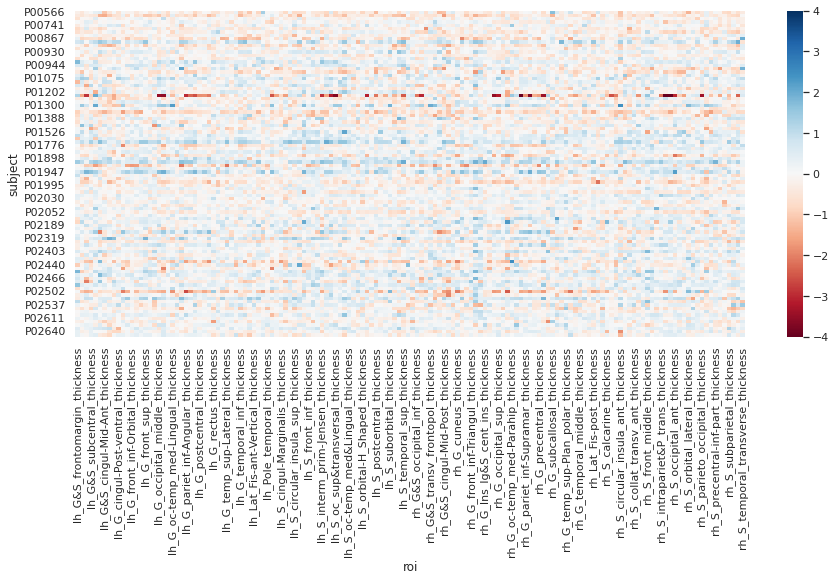

In [305]:
fig, ax = plt.subplots(1,1, figsize=(15,6))
sns.heatmap(ESO_diff[thick_id], vmin=-4, vmax=4, cmap='RdBu', ax=ax)

# Patient-level analysis - extreme patients, similar patients

In [359]:
z_score_sim = custom.spearman_matrices(ESO_diff[thick_id].T, ESO_diff[thick_id].T)
pk = z_score_sim[2]
for irow in range(0,pk.shape[0]):
    pk = pk[:, pk[irow, :].argsort()]
sns.heatmap(pk, cmap=ColdHot_r, vmin=-0.075, vmax=0.075)

{'icoord': [[15.0, 15.0, 25.0, 25.0],
  [5.0, 5.0, 20.0, 20.0],
  [145.0, 145.0, 155.0, 155.0],
  [135.0, 135.0, 150.0, 150.0],
  [125.0, 125.0, 142.5, 142.5],
  [285.0, 285.0, 295.0, 295.0],
  [275.0, 275.0, 290.0, 290.0],
  [265.0, 265.0, 282.5, 282.5],
  [255.0, 255.0, 273.75, 273.75],
  [245.0, 245.0, 264.375, 264.375],
  [235.0, 235.0, 254.6875, 254.6875],
  [225.0, 225.0, 244.84375, 244.84375],
  [215.0, 215.0, 234.921875, 234.921875],
  [205.0, 205.0, 224.9609375, 224.9609375],
  [195.0, 195.0, 214.98046875, 214.98046875],
  [185.0, 185.0, 204.990234375, 204.990234375],
  [175.0, 175.0, 194.9951171875, 194.9951171875],
  [165.0, 165.0, 184.99755859375, 184.99755859375],
  [133.75, 133.75, 174.998779296875, 174.998779296875],
  [115.0, 115.0, 154.3743896484375, 154.3743896484375],
  [545.0, 545.0, 555.0, 555.0],
  [535.0, 535.0, 550.0, 550.0],
  [525.0, 525.0, 542.5, 542.5],
  [515.0, 515.0, 533.75, 533.75],
  [505.0, 505.0, 524.375, 524.375],
  [495.0, 495.0, 514.6875, 514.6875]

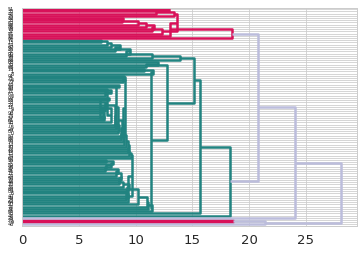

In [182]:
# Trying hierarchical clustering
from scipy.cluster.hierarchy import centroid, fcluster, dendrogram
from scipy.spatial.distance import pdist

# compute the distance matrix
dist = pdist(ESO_diff_z[thick_id], metric='euclidean')
Z = centroid(dist)

dendrogram(Z, above_threshold_color='#bcbddc', orientation='right')

<AxesSubplot:xlabel='0', ylabel='1'>

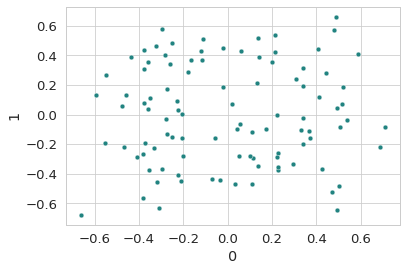

In [144]:
# Trying non-metric MDS
from sklearn.manifold import MDS
embedding = MDS(n_components=2, metric=False)
X_transformed = embedding.fit_transform(ESO_diff_z[thick_id])
sns.scatterplot(data=pd.DataFrame(X_transformed), x=0, y=1)

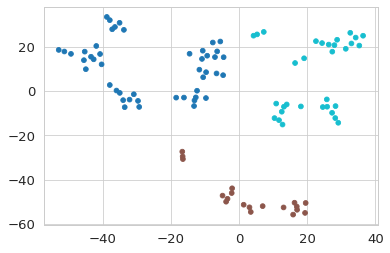

In [183]:
# Trying TSNE
from  sklearn.manifold import TSNE
# trying tsne
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=2).fit_transform(ESO_diff_z[thick_id])

kmeans_res = KMeans(n_clusters = 3)
label = kmeans_res.fit_predict(X_embedded)


plt.scatter(X_embedded[:,0], X_embedded[:,1], c=label, cmap='tab10')

In [194]:
# going for kmeans
kmeans_res = KMeans(n_clusters = 4, n_init=100, max_iter=1000, tol=1e-4, random_state=42)
label = kmeans_res.fit_predict(ESO_diff_z)
print(np.unique(label, return_counts=True))

In [212]:
# plotting kmeans
for i in range(0,4):
    print(str(i))

    data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[label==i].mean(), columns=['zdiff']), hemi='r', method='counts')
    plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, cmap=poster_blue_pink_palette_normal, bg_map=fs_sulc, vmin=-1, vmax=1).save_as_html(os.path.join(paper_im_dir, 'PCA_'+str(i)+'_r.html'))

    data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[label==i].mean(), columns=['zdiff']), hemi='l', method='counts')
    plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, cmap=poster_blue_pink_palette_normal, bg_map=fs_sulc, vmin=-1, vmax=1).save_as_html(os.path.join(paper_im_dir, 'PCA_'+str(i)+'_l.html'))


0


/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')


1
2
3


In [199]:
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[label==1].mean(), columns=['zdiff']), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, cmap=poster_blue_pink_palette_normal, bg_map=fs_sulc,  vmin=-1, vmax=1)


/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')


In [201]:
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[label==2].mean(), columns=['zdiff']), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, cmap=poster_blue_pink_palette_normal, bg_map=fs_sulc, vmin=-1, vmax=1)


In [202]:
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[label==3].mean(), columns=['zdiff']), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, cmap=poster_blue_pink_palette_normal, bg_map=fs_sulc, vmin=-1, vmax=1)


Text(0.5, 1.0, 'Elbow Method For Optimal k')

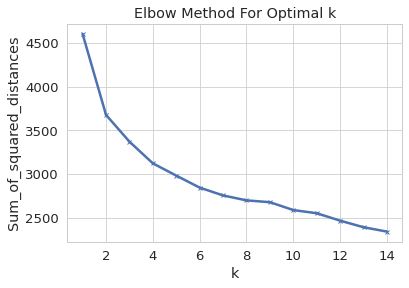

In [187]:
# trying kmeans
from sklearn.cluster import KMeans

Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(ESO_diff[thick_id])
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')


#kmeans_res = KMeans(n_clusters = 4)
#label = kmeans_res.fit_predict(ESO_diff_z[thick_id])

For n_clusters = 2 The average silhouette_score is : 0.270910321750291
For n_clusters = 3 The average silhouette_score is : 0.24120423011514802
For n_clusters = 4 The average silhouette_score is : 0.1536221482361477
For n_clusters = 5 The average silhouette_score is : 0.14756998980620747
For n_clusters = 6 The average silhouette_score is : 0.1337386472782461


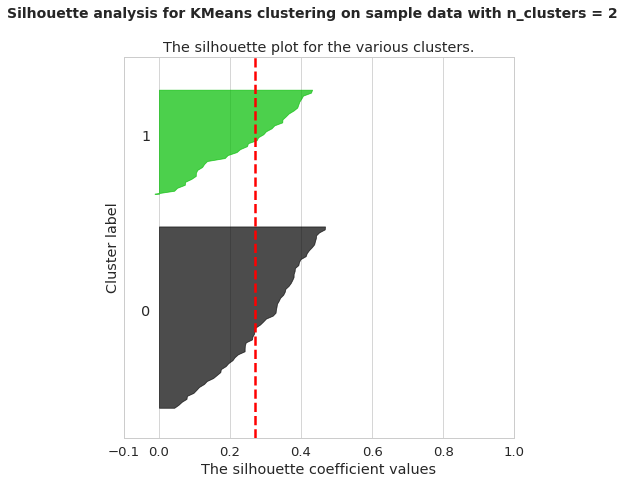

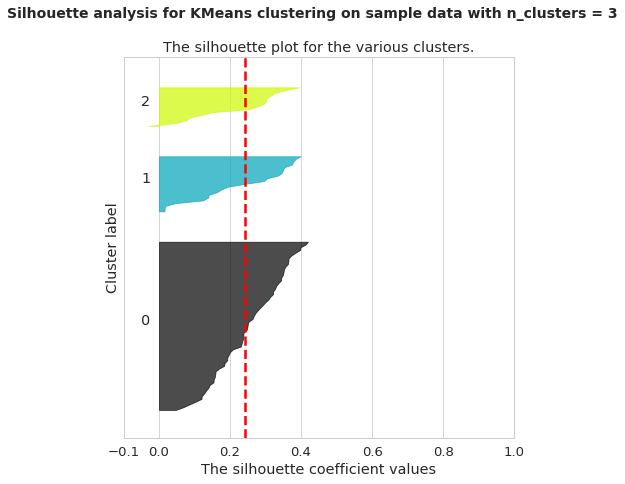

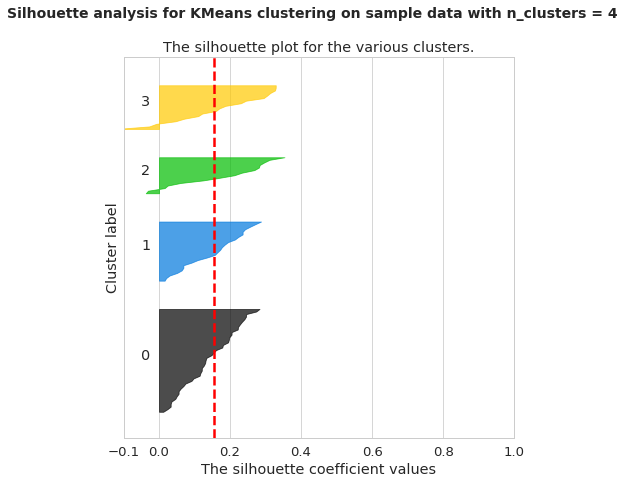

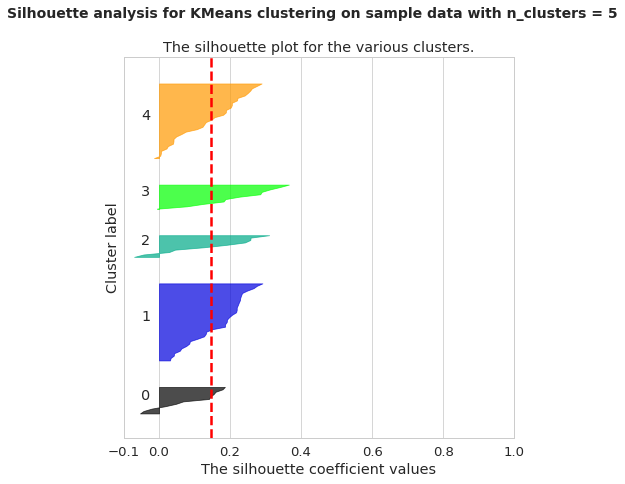

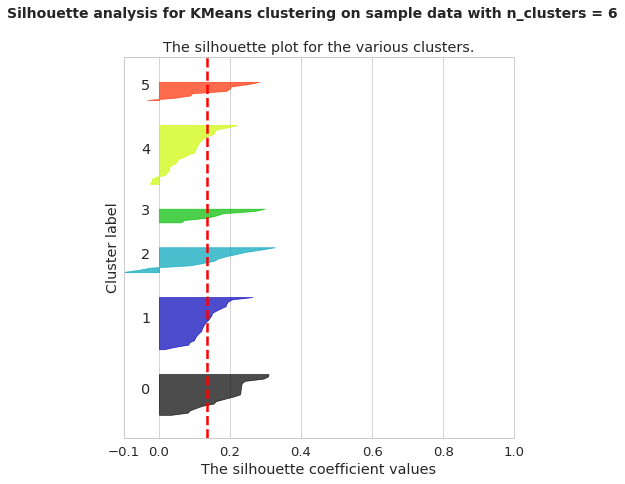

In [215]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

X= ESO_diff_z[thick_id]

for n_clusters in range(2,7):
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(7, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()


In [125]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline


In [127]:
thick_id = thick_idp
pca = PCA(n_components=10)
pca.fit(ESO_diff_z[thick_id])
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.57443538 0.12582691 0.03725504 0.02801176 0.015409   0.01408803
 0.0125708  0.01140207 0.01083149 0.00989385]
[108.15292853  50.617939    27.54293306  23.88294477  17.71352177
  16.93724543  15.99923537  15.23735445  14.85120754  14.19385707]


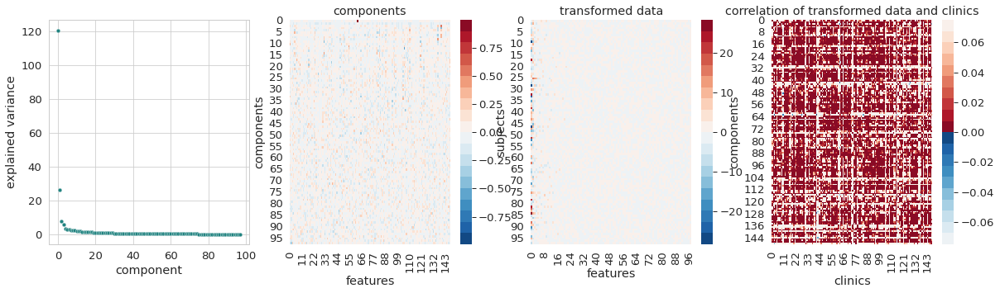

In [141]:
scaled_clf = make_pipeline(PCA(n_components = min(ESO_diff_z[thick_id].shape), svd_solver='full', copy=True, random_state=42)) 
scaled_clf.fit(ESO_diff_z[thick_id])
analyze_pca = scaled_clf.named_steps["pca"].transform(ESO_diff_z[thick_id])
c, p, pplot = custom.spearman_matrices(ESO_diff[thick_id], ESO_diff[thick_id])

fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, analyze_pca, pplot)

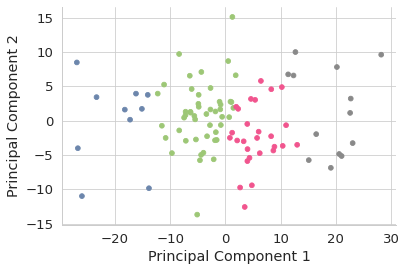

In [214]:
new_palette = ['#898989', '#FBFCF4', '#F6F9E9', '#F2F6DE', '#EDF3D3', '#E9F0C8', '#E4EDBD', '#E0EAB2', '#DCE8A7', '#D7E59B', '#D3E290', '#CEDF85', '#CADC7A', '#C5D96F', '#C1D664', '#BCD359', '#B8D04E', '#B3CE56', '#ADCD5E', '#A8CB66', '#A3C96E', '#9DC776', '#98C67E', '#93C486', '#8EC28F', '#88C097', '#83BF9F', '#7EBDA7', '#78BBAF', '#73B9B7', '#6EB8BF', '#68B6C7', '#63B4CF', '#64AFCC', '#65ABC8', '#66A6C5', '#66A2C1', '#679DBE', '#6898BA', '#6994B7', '#6A8FB3', '#6B8BB0', '#6C86AC', '#6D81A9', '#6D7DA5', '#6E78A2', '#6F749E', '#706F9B', '#786D9A', '#806C99', '#886A99', '#906998', '#986797', '#A06596', '#A86495', '#B16294', '#B96094', '#C15F93', '#C95D92', '#D15C91', '#D95A90', '#E15890', '#E9578F', '#F1558E']
new_palette = ListedColormap(new_palette, 'indexed')

plt.scatter(analyze_pca[:,0], analyze_pca[:,1], c=label, cmap=new_palette)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
sns.despine()
plt.savefig(os.path.join(paper_im_dir,'PCA_groups.png'), dpi=300, bbox_inches='tight')

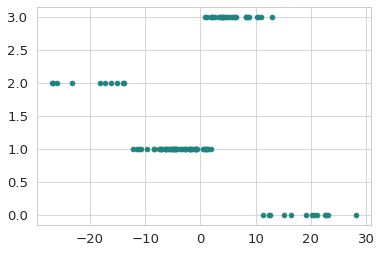

In [213]:
plt.scatter(analyze_pca[:,0], label)

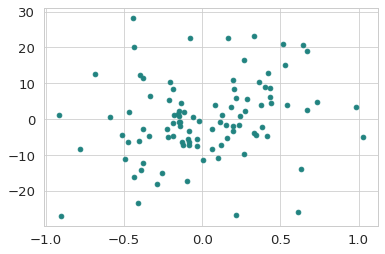

In [134]:
plt.scatter(ESO_diff_z.T.mean(), analyze_pca[:,0])

In [138]:
pg.corr(ESO_diff_z.T.mean(), analyze_pca[:,0],method='spearman')

,n,r,CI95%,p-val,power
spearman,98,0.263585,"[0.07, 0.44]",0.008731,0.752731


In [456]:
pca_df = pd.DataFrame(analyze_pca)
pca_df['label'] = label

In [480]:
lower = ESO_diff_z.iloc[pca_df[pca_df[0]<-5].index].index
upper = ESO_diff_z.iloc[pca_df[pca_df[0]>5].index].index

ESO_diff_z['extremes'] = 'neutral'
ESO_diff_z.loc[lower, 'extremes'] = 'lower'
ESO_diff_z.loc[upper, 'extremes'] = 'upper'

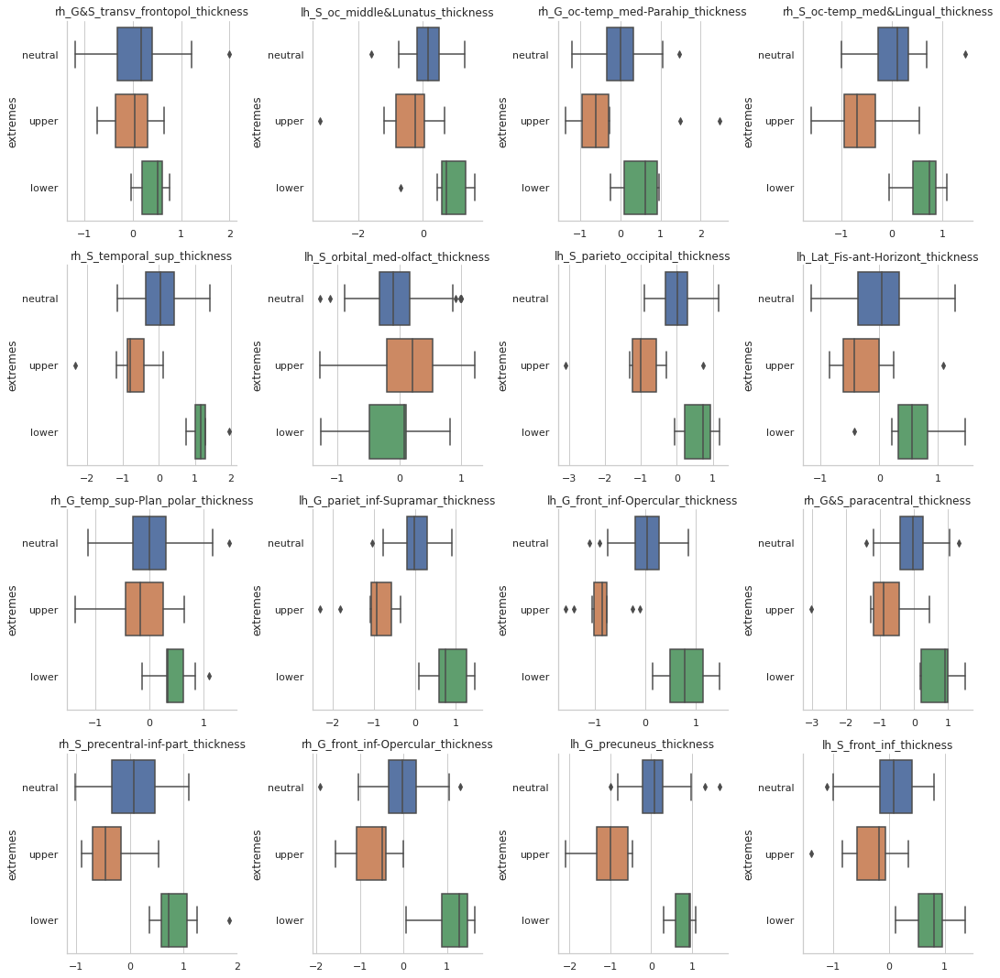

In [484]:
random_idp = np.random.choice(thick_id, 16)
fig, ax = plt.subplots(4,4, figsize=(15,15))
for iplot, idp in enumerate(random_idp):
    sns.boxplot(data = ESO_diff_z[[*thick_id,'extremes']], x = idp, y='extremes', ax=ax.flatten()[iplot])
    ax.flatten()[iplot].set_title(idp)
    ax.flatten()[iplot].set_xlabel('')
    sns.despine(fig=fig, ax=ax.flatten()[iplot])
fig.tight_layout()

In [514]:
# plot the variance across the ROIs
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[lower, thick_id].mean(), columns=['zdiff']), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmin = -2, vmax = 2, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_upper_idp_r.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[lower, thick_id].mean(), columns=['zdiff']), hemi='l', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmin = -2, vmax = 2, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_upper_idp_l.html'))

###################
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[upper, thick_id].mean(), columns=['zdiff']), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmin = -2, vmax = 2, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_lower_idp_r.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[upper, thick_id].mean(), columns=['zdiff']), hemi='l', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmin = -2, vmax = 2, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_lower_idp_l.html'))

###################
data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[ESO_diff_z['extremes']=='neutral', thick_id].mean(), columns=['zdiff']), hemi='r', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmin = -2, vmax = 2, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_neutral_idp_r.html'))

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pd.DataFrame(ESO_diff_z.loc[ESO_diff_z['extremes']=='neutral', thick_id].mean(), columns=['zdiff']), hemi='l', method='counts')
plotting.view_surf(fs_plot, data_mapping, threshold=None, symmetric_cmap=False, vmin = -2, vmax = 2, cmap=poster_blue_pink_palette_r, bg_map=fs_sulc).save_as_html(os.path.join(paper_im_dir, 'diff_z_neutral_idp_l.html'))

# Potential correlation with the amount of movement?

In [5]:
# Compute the difference between the visits
#idp_ids = idp_ids[:-1]

pat_diff = ((long_patients.sel(roi=idp_ids, visit='v2', preproc='y_orig').features - long_patients.sel(roi=idp_ids, visit='v2', preproc='yhat_orig').features
) - (
    long_patients.sel(roi=idp_ids, visit='v1', preproc='y_orig').features - long_patients.sel(roi=idp_ids, visit='v1', preproc='yhat_orig').features))

pat_diff = pat_diff.to_pandas()

cont_diff = ((long_controls.sel(roi=idp_ids, visit='v2', preproc='y_orig').features - long_controls.sel(roi=idp_ids, visit='v2', preproc='yhat_orig').features
) - (
    long_controls.sel(roi=idp_ids, visit='v1', preproc='y_orig').features - long_controls.sel(roi=idp_ids, visit='v1', preproc='yhat_orig').features))

cont_diff = cont_diff.to_pandas()

### Load the movement parameters

In [14]:
# load the movement parameters
v1_c_mov = pd.read_csv(os.path.join('/home/barbora/Documents/Projects/Normative_Models/ESO/fMRI_movement', 'v1_cont_movement.csv'), index_col=1)
v2_c_mov = pd.read_csv(os.path.join('/home/barbora/Documents/Projects/Normative_Models/ESO/fMRI_movement', 'v2_cont_movement.csv'), index_col=1)

v1_p_mov = pd.read_csv(os.path.join('/home/barbora/Documents/Projects/Normative_Models/ESO/fMRI_movement', 'v1_pat_movement.csv'), index_col=1)
v2_p_mov = pd.read_csv(os.path.join('/home/barbora/Documents/Projects/Normative_Models/ESO/fMRI_movement', 'v2_pat_movement.csv'), index_col=1)

In [19]:
cont_diff = cont_diff.merge(how='inner', right=v1_c_mov, left_index=True, right_index=True).merge(how='inner', right=v2_c_mov, left_index=True, right_index=True)
pat_diff = pat_diff.merge(how='inner', right=v1_p_mov, left_index=True, right_index=True).merge(how='inner', right=v2_p_mov, left_index=True, right_index=True)

<AxesSubplot:ylabel='Count'>

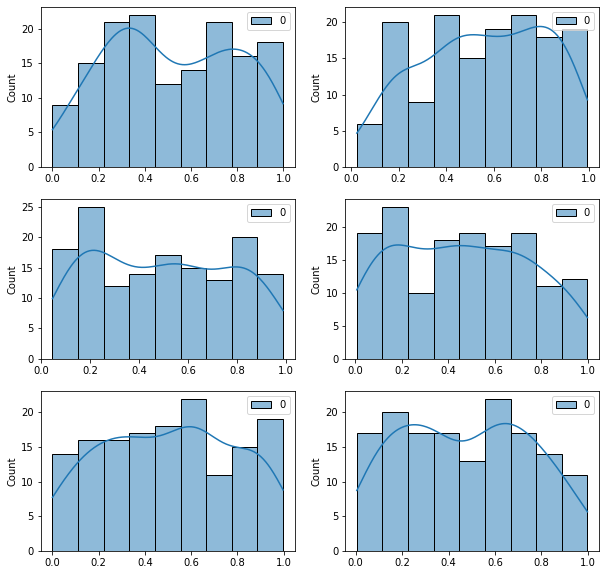

In [42]:
thick_idp = [i for i in cont_diff.columns if 'thickness' in i]

fig,ax = plt.subplots(3,2, figsize=(10,10))
pk = custom.spearman_matrices(cont_diff[thick_idp].to_numpy(), cont_diff['mean_FD_x'].to_numpy()[:,np.newaxis])
sns.histplot(pk[1], ax=ax[0,0], kde=True, color='k')
pk = custom.spearman_matrices(cont_diff[thick_idp].to_numpy(), cont_diff['mean_FD_y'].to_numpy()[:,np.newaxis])
sns.histplot(pk[1], ax=ax[0,1], kde=True, color='k')
pk = custom.spearman_matrices(pat_diff[thick_idp].to_numpy(), pat_diff['mean_FD_x'].to_numpy()[:,np.newaxis])
sns.histplot(pk[1], ax=ax[1,0], kde=True, color='k')
pk = custom.spearman_matrices(pat_diff[thick_idp].to_numpy(), pat_diff['mean_FD_y'].to_numpy()[:,np.newaxis])
sns.histplot(pk[1], ax=ax[1,1], kde=True, color='k')
pk = custom.spearman_matrices(cont_diff[thick_idp].to_numpy(), cont_diff['mean_FD_y'].to_numpy()[:,np.newaxis]-cont_diff['mean_FD_x'].to_numpy()[:,np.newaxis])
sns.histplot(pk[1], ax=ax[2,0], kde=True, color='k')
pk = custom.spearman_matrices(pat_diff[thick_idp].to_numpy(), pat_diff['mean_FD_y'].to_numpy()[:,np.newaxis]-pat_diff['mean_FD_x'].to_numpy()[:,np.newaxis])
sns.histplot(pk[1], ax=ax[2,1], kde=True, color='k')

#pk = custom.spearman_matrices(long_controls.sel(roi=idp_ids, visit='v1', preproc='z_orig').features.to_numpy(), cont_diff['mean_FD_x'].to_numpy()[:,np.newaxis])


In [38]:
long_controls.sel(roi=idp_ids, visit='v1', preproc='z_orig').features.to_numpy().shape

(34, 185)

In [39]:
cont_diff.shape

(32, 187)

# MOCK NEW Z-scores -- lack of time

In [7]:
# prepare dataframe with variances across difference
diff_S2 = pd.DataFrame(ESO_diff[idp_ids].var())
diff_S2 = diff_S2.T
diff_S2 = diff_S2.append([diff_S2]*(patients.subject.shape[0]-1),ignore_index=True)
diff_S2.index = patients.subject

nom = patients.sel(preproc = 'y_orig', var_type='models', visit='v1', var=idp_ids[0]) - patients.sel(preproc = 'yhat_orig', var_type='models', visit='v1', var=idp_ids[0]) 
denom = (patients.sel(preproc = 'ys2_orig', var_type='models', visit='v1', var=idp_ids[0]) + diff_S2).to_pandas()
denom = np.array(denom, dtype=np.float64)

v1_Z = (nom/np.sqrt(denom)).to_pandas()

nom = patients.sel(preproc = 'y_orig', var_type='models', visit='v2', var=idp_ids[0]) - patients.sel(preproc = 'yhat_orig', var_type='models', visit='v2', var=idp_ids[0]) 
denom = (patients.sel(preproc = 'ys2_orig', var_type='models', visit='v2', var=idp_ids[0]) + diff_S2).to_pandas()
denom = np.array(denom, dtype=np.float64)

v2_Z = (nom/np.sqrt(denom)).to_pandas()

# PCA  and extreme deviations analysis

**PCA**

In [131]:
def pca_plotting(explained_variance, components, transformed, pplot=None):
    """
    subplots of the basic PCA analysis
    - explained variance scree plot (vector of explained variance per component)
    - heatmap of components (matrix)
    - heatmap of transformed data (matrix)
    pca_plotting(explained_variance, components, transformed)
    """


    # prepare color scale
    pk = sns.color_palette("RdBu_r", 20)
    pk1 = pk[0:10]
    pk2 = pk[10:]
    ColdHot = ListedColormap([*pk1,*pk2])
    pk1.reverse()
    pk2.reverse()
    ColdHot_r = ListedColormap([*pk1,*pk2])
    
    if pplot is not None:
        nrows = 1
        ncols = 4
    else:
        nrows = 1
        ncols = 3

    fig, ax = plt.subplots(nrows,ncols,figsize=(ncols*5, nrows*5))
    # get rif of this in case you want transparent background
    fig.patch.set_facecolor('white')

    sns.scatterplot(range(0,explained_variance.shape[0]), explained_variance, ax=ax[0])

    ax[0].set_ylabel('explained variance')
    ax[0].set_xlabel('component')

    sns.heatmap(components, cmap=ColdHot,ax=ax[1], 
                vmin=np.max(abs(components))*-1,
                vmax=np.max(abs(components))
                )

    ax[1].set_title('components')
    ax[1].set_ylabel('components')
    ax[1].set_xlabel('features')

    sns.heatmap(transformed, 
                vmin = np.max(abs(transformed))*-1,
                vmax = np.max(abs(transformed)),
                cmap=ColdHot, ax=ax[2])
    ax[2].set_title('transformed data')
    ax[2].set_ylabel('subjects')
    ax[2].set_xlabel('features')

    if pplot is not None:
        sns.heatmap(pplot, 
                vmin = -0.075,
                vmax = 0.075,
                cmap=ColdHot_r, ax=ax[3])
        ax[3].set_title('correlation of transformed data and clinics')
        ax[3].set_ylabel('components')
        ax[3].set_xlabel('clinics')

    return(fig,ax)

In [130]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

img_dir = os.path.join(project_dir,'ESO', 'models', 'full_analysis', 'pretrained_zscores_long', 'img')

**Fit and plot all PCA combinations I can think of and correlate them with clinics (GAF, PANSS_sumP, PANSS_sumN)**

In [69]:
# Fit to data and predict using pipelined PCA
thick_id = [i for i in idp_ids if 'thickness' in i]
vol_id = [i for i in idp_ids if 'thickness' not in i]

# pick features to analyze 
# thickness
# volume
# thickness_&_volume
feat_to_analyze = 'thickness'
feat_to_analyze_list = ['thickness', 'volume']

for feat_to_analyze in feat_to_analyze_list:
    if feat_to_analyze == 'thickness':
        v1_analyze = v1_Z[thick_id]
        v2_analyze = v2_Z[thick_id]
    elif feat_to_analyze == 'volume':
        v1_analyze = v1_Z[vol_id]
        v2_analyze = v2_Z[vol_id]
    elif feat_to_analyze == 'thickness_&_volume':
        v1_analyze = v1_Z
        v2_analyze = v2_Z

    # pick the scaling to perform before the PCA
    # 0 - no scaling
    # 10 - demeaning
    # 11 - demeaning and stdev = 1
    scaling_list = [0,10,11]
    for scaling in scaling_list:
        if scaling == 11:
            scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=True), PCA(n_components = min(v1_Z.shape), svd_solver='full', copy=True, random_state=42)) 
        elif scaling == 10:
            scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=False), PCA(n_components = min(v1_Z.shape), svd_solver='full', copy=True, random_state=42))
        elif scaling == 0:
            scaled_clf = make_pipeline(PCA(n_components = min(v1_Z.shape), svd_solver='full', copy=True, random_state=42))
            

        if scaling == 11:
            scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=True), PCA(n_components = min(v1_analyze.shape), svd_solver='full', copy=True, random_state=42))
        elif scaling == 10:
            scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=False), PCA(n_components = min(v1_analyze.shape), svd_solver='full', copy=True, random_state=42))
        elif scaling == 0:
            scaled_clf = make_pipeline(PCA(n_components = min(v1_analyze.shape), svd_solver='full', copy=True, random_state=42))
            
            
            

        scaled_clf.fit(v1_analyze)
        v1_analyze_pca = scaled_clf.named_steps["pca"].transform(v1_analyze)
        c, p, pplot = custom.spearman_matrices(v1_analyze_pca[:,0:5],
                                    patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v1').to_numpy())
        fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, v1_analyze_pca, pplot)
        fig.suptitle('PCA on V1 '+feat_to_analyze + ' scaling:' +str(scaling))
        plt.savefig(os.path.join(img_dir, 'descript_v1_pca_newZ_'+feat_to_analyze+'_scaling_'+str(scaling)), transparent=False)
        plt.close()


        scaled_clf.fit(v2_analyze)
        v2_analyze_pca = scaled_clf.named_steps["pca"].transform(v2_analyze)
        c, p, pplot = custom.spearman_matrices(v2_analyze_pca[:,0:5],
                                    patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v2').to_numpy())
        fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, v2_analyze_pca, pplot)
        fig.suptitle('PCA on V2 '+feat_to_analyze+ ' scaling:' +str(scaling))
        plt.savefig(os.path.join(img_dir, 'descript_v2_pca_newZ_'+feat_to_analyze+'_scaling_'+str(scaling)), transparent=False)
        plt.close()

        #
        scaled_clf.fit(v1_analyze)
        v2_analyze_pca = scaled_clf.named_steps["pca"].transform(v2_analyze)
        c, p, pplot = custom.spearman_matrices(v2_analyze_pca[:,0:5],
                                    patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v2').to_numpy())
        fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, v2_analyze_pca, pplot)
        fig.suptitle('PCA of V1 applied to V2 '+feat_to_analyze+ ' scaling:' +str(scaling))
        plt.savefig(os.path.join(img_dir, 'descript_v1_2_v2_pca_newZ_'+feat_to_analyze+'_scaling_'+str(scaling)), transparent=False)
        plt.close()
        #

        #
        scaled_clf.fit(v2_analyze)
        v1_analyze_pca = scaled_clf.named_steps["pca"].transform(v1_analyze)
        c, p, pplot = custom.spearman_matrices(v2_analyze_pca[:,0:5],
                                    patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v1').to_numpy())
        fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, v1_analyze_pca, pplot)
        fig.suptitle('PCA of V2 applied to V1 '+feat_to_analyze+ ' scaling:' +str(scaling))
        plt.savefig(os.path.join(img_dir, 'descript_v2_2_v1_pca_newZ_'+feat_to_analyze+'_scaling_'+str(scaling)), transparent=False)
        plt.close()
        #

        scaled_clf.fit(v2_analyze-v1_analyze)
        v2v1_analyze_pca = scaled_clf.named_steps["pca"].transform(v2_analyze-v1_analyze)
        c, p, pplot = custom.spearman_matrices(v2v1_analyze_pca[:,0:5],
                                    patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v2').to_numpy()-patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v1').to_numpy()                            
                                    )
        fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, v2v1_analyze_pca, pplot)
        fig.suptitle('PCA on V2-V1 '+feat_to_analyze+ ' scaling:' +str(scaling))
        plt.savefig(os.path.join(img_dir, 'descript_diff_v2v1_pca_newZ_'+feat_to_analyze+'_scaling_'+str(scaling)), transparent=False)
        plt.close()

/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has

In [52]:
# Plotting scatterplot of one PCA component (first comp. of v2-v1 vs GAF)
feat_to_analyze = 'thickness'

if feat_to_analyze == 'thickness':
    v1_analyze = v1_Z[thick_id]
    v2_analyze = v2_Z[thick_id]
elif feat_to_analyze == 'volume':
    v1_analyze = v1_Z[vol_id]
    v2_analyze = v2_Z[vol_id]
elif feat_to_analyze == 'thickness_&_volume':
    v1_analyze = v1_Z
    v2_analyze = v2_Z


scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=True), PCA(n_components = min(v1_analyze.shape), svd_solver='full', copy=True, random_state=42))
scaled_clf.fit(v2_analyze-v1_analyze)
v2v1_analyze_pca = scaled_clf.named_steps["pca"].transform(v2_analyze-v1_analyze)
clin = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v2').to_numpy()-patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v1').to_numpy()

fig,ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(v2v1_analyze_pca[:,0], clin[:,0], ax=ax, label='GAF')
plt.axhline(y=0)
plt.axvline(x=0)

/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/sklearn/base.py:434: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


# **Decomposition on moth visits together Helmut style**

In [12]:
thick_id = [i for i in idp_ids if 'thickness' in i]
vol_id = [i for i in idp_ids if 'thickness' not in i]

v1_Z_to_concat = v1_Z
v1_Z_newindex = [i+'_1' for i in v1_Z.index]
v1_Z_to_concat.index = v1_Z_newindex

v2_Z_newindex = [i+'_2' for i in v2_Z.index]
v2_Z_to_concat = v2_Z
v2_Z_to_concat.index = v2_Z_newindex

pk = pd.concat([v1_Z_to_concat[thick_id], v2_Z_to_concat[thick_id]])
pk.reset_index(inplace=True)

pk = pk.T
pk.columns = np.squeeze(pk.loc[['index']].to_numpy()).tolist()

pk.drop(labels=['index'], axis=0, inplace=True)
pk = pk.astype(float)


In [35]:
from scipy.linalg import svd
# Careful! V is transposed
U, s, V = svd(pk, full_matrices=False)

print('pk'+str(pk.shape))
print('U'+str(U.shape))
print('s'+str(s.shape))
print('V'+str(V.shape))

pk(148, 228)
U(148, 148)
s(148,)
V(148, 228)


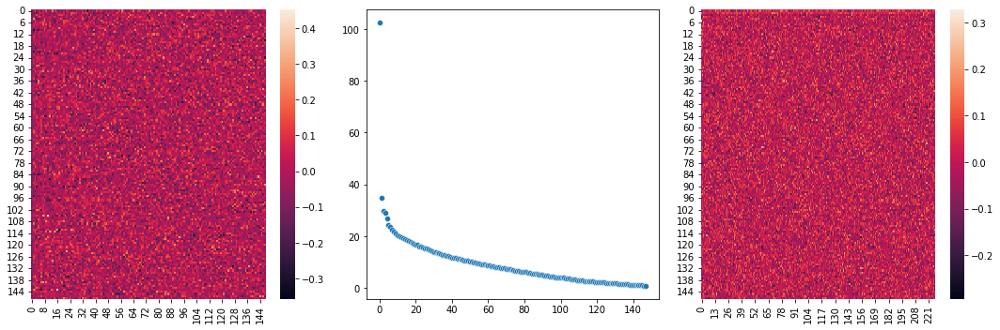

In [25]:
fig,ax =plt.subplots(1,3,figsize=(15,5))
sns.heatmap(U, ax=ax[0])
sns.scatterplot(range(0,s.shape[0]),s, ax=ax[1])
sns.heatmap(V, ax=ax[2])
plt.tight_layout()

In [30]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

img_dir = os.path.join(project_dir,'ESO', 'models', 'full_analysis', 'pretrained_zscores_long', 'img')

In [53]:
feat_to_analyze = 'thickness'
scaling = 0

if scaling == 11:
    scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=True), PCA(svd_solver='full', copy=True, random_state=42)) 
elif scaling == 10:
    scaled_clf = make_pipeline(StandardScaler(with_mean = True, with_std=False), PCA( svd_solver='full', copy=True, random_state=42))
elif scaling == 0:
    scaled_clf = make_pipeline(PCA( svd_solver='full', copy=True, random_state=42))

scaled_clf.fit(pk)
pk_pca = scaled_clf.named_steps["pca"].transform(pk)
#    c, p, pplot = custom.spearman_matrices(pk_pca[:,0:5],
#                                patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[ 'GAF', 'PANSS_sumP', 'PANSS_sumN'], visit='v1').to_numpy())
#    fig,ax = pca_plotting(scaled_clf.named_steps['pca'].explained_variance_, scaled_clf.named_steps['pca'].components_, pk_pca, pplot)
#    fig.suptitle('PCA on V1 '+feat_to_analyze + ' scaling:' +str(scaling))
    

<AxesSubplot:>

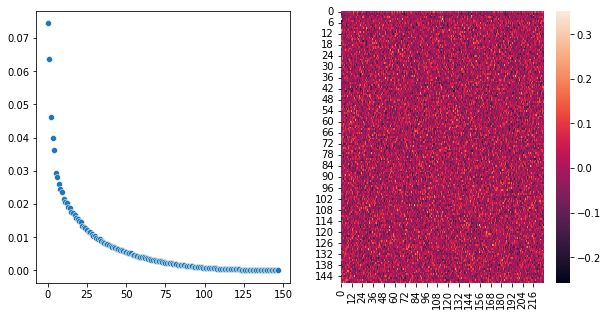

In [54]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
sns.scatterplot(range(0,scaled_clf.named_steps['pca'].explained_variance_ratio_.shape[0]),scaled_clf.named_steps['pca'].explained_variance_ratio_, ax=ax[0])
sns.heatmap(scaled_clf.named_steps['pca'].components_, ax=ax[1])

In [55]:
V

array([[ 0.00197249, -0.02672574,  0.06428636, ...,  0.05888213,
         0.07368528,  0.03824623],
       [ 0.12387533,  0.00583416,  0.08404022, ...,  0.03205095,
         0.0318448 , -0.01728195],
       [-0.05724208, -0.02393955, -0.01528163, ..., -0.07682725,
        -0.05578245, -0.03038149],
       ...,
       [-0.14262471,  0.05096997,  0.08892885, ...,  0.036508  ,
        -0.05697427,  0.05198571],
       [-0.01082689,  0.00238131,  0.09455443, ...,  0.06173386,
        -0.02459169, -0.0063291 ],
       [-0.00563086,  0.0431633 ,  0.04847604, ..., -0.03695164,
         0.07854815, -0.00917849]])

In [56]:
scaled_clf.named_steps['pca'].components_


array([[ 7.49720617e-02, -3.60988250e-02,  3.62525865e-02, ...,
         9.15634603e-02,  1.22833703e-01,  6.08055740e-02],
       [-1.02275943e-01, -1.30182813e-02, -8.36046783e-02, ...,
        -8.94708265e-03, -1.68358133e-05,  3.40322457e-02],
       [ 3.23664998e-03, -1.58704522e-02, -5.76606349e-02, ...,
        -5.40955591e-02, -1.28820486e-02, -1.51881363e-02],
       ...,
       [-4.05736507e-03, -2.28467008e-03,  9.07511249e-02, ...,
         5.72770308e-02, -2.28660024e-02, -1.40207397e-02],
       [ 1.22558838e-02, -5.10580229e-02, -4.82189929e-02, ...,
         2.49516477e-02, -7.34896482e-02, -9.61122549e-03],
       [ 1.47109206e-02,  1.13955656e-01,  3.67087230e-02, ...,
         3.00502611e-02, -4.40176902e-02, -1.05742553e-01]])

# Outliers

In [9]:
# sorting all ROIs together rather then across each ROI separately
z_compar = pd.DataFrame(v1_Z.stack(), columns = ['val'])
z_compar['idp'] = z_compar.index.get_level_values(1).astype('category')
z_compar['id'] = z_compar.index.get_level_values(0).astype('category')
z_compar = z_compar.sort_values('val')
z_compar['order'] = range(0,z_compar.shape[0])
z_compar = z_compar['order'].unstack()

In [62]:
diff = v2_Z - v1_Z
clin_var = 'GAF'
clin_diff = np.array(patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[clin_var], visit='v2')) - np.array(patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[clin_var], visit='v1'))

for i,idp in enumerate(idp_ids):

    v1_pk = pd.DataFrame(v1_Z[idp].sort_values())
    v1_pk[idp] = range(1,115)

    v2_pk = pd.DataFrame(v2_Z[idp].sort_values())
    v2_pk[idp] = range(1,115)

    diff_pk = pd.DataFrame(diff[idp].sort_values())
    diff_pk[idp] = range(1,115)

    if i == 0:
        v1_ordered = v1_pk
        v2_ordered = v2_pk
        diff_ordered = diff_pk
    else:
        v1_ordered = pd.concat([v1_ordered,v1_pk], axis = 1)
        v2_ordered = pd.concat([v2_ordered,v2_pk], axis = 1)
        diff_ordered = pd.concat([diff_ordered,diff_pk], axis = 1)

v1_ordered.sort_index(inplace = True)
v2_ordered.sort_index(inplace = True)
diff_ordered.sort_index(inplace = True)

In [193]:
diff = v2_Z - v1_Z
clin_var = 'PANSS_sumN'
clin_diff = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[clin_var], visit='v2')  - patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=[clin_var], visit='v1')

v1_clin = np.zeros((len(idp_ids),6))
v2_clin = np.zeros((len(idp_ids),6))
diff_clin = np.zeros((len(idp_ids),6))

for i, idp in enumerate(idp_ids):

    v1_pk1 = v1_ordered.iloc[np.where(v1_ordered[idp]<6)[0]].index
    v1_pk2 = v1_ordered.iloc[np.where((v1_ordered[idp]>5) & (v1_ordered[idp]<110))[0]].index
    v1_pk3 = v1_ordered.iloc[np.where(v1_ordered[idp]>109)[0]].index
    
    v1_clin[i,0] = v1_Z.loc[v1_pk1][idp].mean()
    v1_clin[i,1] = v1_Z.loc[v1_pk2][idp].mean()
    v1_clin[i,2] = v1_Z.loc[v1_pk3][idp].mean()

    v1_clin[i,3] = np.array(patients.sel(var_type='clin', roi=idp, preproc='z_orig', var=['GAF'], visit='v1', subject=v1_pk1).mean())
    v1_clin[i,4] = np.array(patients.sel(var_type='clin', roi=idp, preproc='z_orig', var=['GAF'], visit='v1', subject=v1_pk2).mean())
    v1_clin[i,5] = np.array(patients.sel(var_type='clin', roi=idp, preproc='z_orig', var=['GAF'], visit='v1', subject=v1_pk3).mean())

    v2_pk1 = v2_ordered.iloc[np.where(v2_ordered[idp]<6)[0]].index
    v2_pk2 = v2_ordered.iloc[np.where((v2_ordered[idp]>5) & (v2_ordered[idp]<110))[0]].index
    v2_pk3 = v2_ordered.iloc[np.where(v2_ordered[idp]>109)[0]].index
    
    v2_clin[i,0] = v1_Z.loc[v2_pk1][idp].mean()
    v2_clin[i,1] = v1_Z.loc[v2_pk2][idp].mean()
    v2_clin[i,2] = v1_Z.loc[v2_pk3][idp].mean()
    
    v2_clin[i,3] = np.array(patients.sel(var_type='clin', roi=idp, preproc='z_orig', var=['GAF'], visit='v2', subject=v2_pk1).mean())
    v2_clin[i,4] = np.array(patients.sel(var_type='clin', roi=idp, preproc='z_orig', var=['GAF'], visit='v2', subject=v2_pk2).mean())
    v2_clin[i,5] = np.array(patients.sel(var_type='clin', roi=idp, preproc='z_orig', var=['GAF'], visit='v2', subject=v2_pk3).mean())

    diff_pk1 = diff_ordered.iloc[np.where(diff_ordered[idp]<6)[0]].index
    diff_pk2 = diff_ordered.iloc[np.where((diff_ordered[idp]>5) & (diff_ordered[idp]<110))[0]].index
    diff_pk3 = diff_ordered.iloc[np.where(diff_ordered[idp]>109)[0]].index
    
    diff_clin[i,0] = diff.loc[diff_pk1][idp].mean()
    diff_clin[i,1] = diff.loc[diff_pk2][idp].mean()
    diff_clin[i,2] = diff.loc[diff_pk3][idp].mean()
    
    diff_clin[i,3] = np.array(clin_diff.sel(subject=diff_pk1).mean())
    diff_clin[i,4] = np.array(clin_diff.sel(subject=diff_pk2).mean())
    diff_clin[i,5] = np.array(clin_diff.sel(subject=diff_pk3).mean())


v1_clin = pd.DataFrame(v1_clin, index=idp_ids, columns=['lower idp', 'middle idp', 'upper idp','lower clin', 'middle clin', 'upper clin'])
v2_clin = pd.DataFrame(v2_clin, index=idp_ids, columns=['lower idp', 'middle idp', 'upper idp','lower clin', 'middle clin', 'upper clin'])
diff_clin = pd.DataFrame(diff_clin, index=idp_ids, columns=['lower idp', 'middle idp', 'upper idp','lower clin', 'middle clin', 'upper clin'])

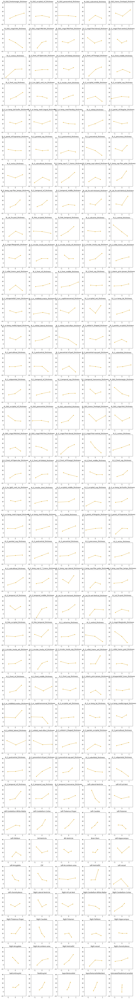

In [129]:
#diff_clin = diff_clin.to_numpy()

nrows = 37
ncols = 5
fig,ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3,nrows*3))
for i, idp in enumerate(idp_ids):
    
    sns.lineplot(diff_clin[i][0:3], diff_clin[i][3:6],ax=ax[i//ncols,i%ncols], color='goldenrod')
    sns.scatterplot(diff_clin[i][0:3], diff_clin[i][3:6],ax=ax[i//ncols,i%ncols], color='goldenrod')

    ax[i//ncols,i%ncols].set_title(idp)
    ax[i//ncols,i%ncols].set(ylim=(-10,40))
    ax[i//ncols,i%ncols].set(xlim=(-1.5,1.5))
plt.tight_layout()

<AxesSubplot:ylabel='Count'>

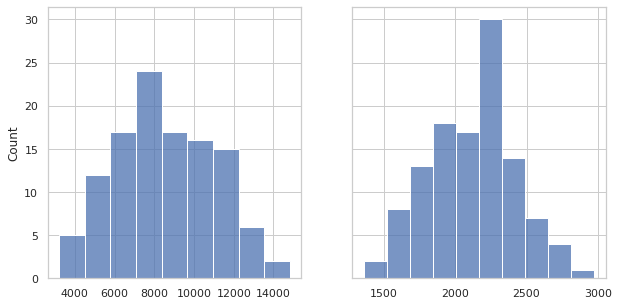

In [141]:
sns.set_theme(style="whitegrid")
fig,ax = plt.subplots(1,2,figsize=(10,5), sharey=True)
sns.histplot(diff_ordered[thick_id].sum(axis=1),ax=ax[0])
sns.histplot(diff_ordered[vol_id].sum(axis=1),ax=ax[1])



In [150]:
L1 = diff_ordered[thick_id].sum(axis=1).sort_values()[0:15].index
L2 = diff_ordered[vol_id].sum(axis=1).sort_values()[-15:].index

print(L1)
print(L2)


Index(['P01330', 'P00574', 'P01939', 'P00914', 'P01988', 'P02332', 'P02502',
       'P00964', 'P02052', 'P01896', 'P02439', 'P02647', 'P00766', 'P01264',
       'P02546'],
      dtype='object', name='subject')
Index(['P01618', 'P01072', 'P00907', 'P01995', 'P02261', 'P01776', 'P02167',
       'P01412', 'P02482', 'P02337', 'P02567', 'P01731', 'P01526', 'P02023',
       'P01096'],
      dtype='object', name='subject')


In [195]:
clin_diff.sel(subject=L2)[[4,7]]

<xarray.DataArray (subject: 2, var: 1)>
array([[5.0],
       [6.0]], dtype=object)
Coordinates:
  * var       (var) <U34 'PANSS_sumN'
  * subject   (subject) <U6 'P02261' 'P01412'
    roi       <U34 'lh_G&S_frontomargin_thickness'
    preproc   <U6 'z_orig'
    var_type  <U4 'clin'

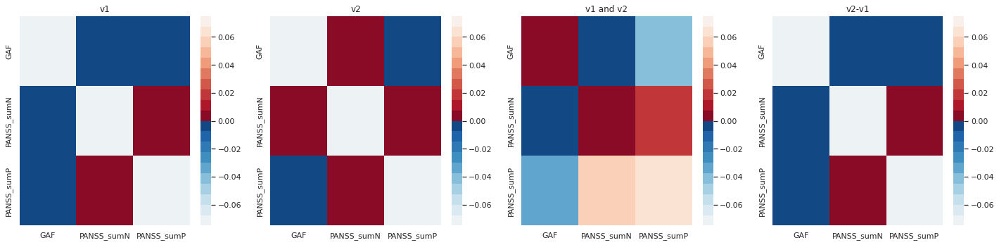

In [207]:
# correlate clinical scales
fix, ax = plt.subplots(1,4,figsize=(20,5))

to_corr = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=['GAF', 'PANSS_sumN','PANSS_sumP'], visit='v1')
c,p,pplot = custom.spearman_matrices(to_corr.to_numpy(),to_corr.to_numpy())
sns.heatmap(pplot-np.eye(3), vmin=-0.075, vmax=0.075, cmap=ColdHot_r,ax=ax[0])
ax[0].set(xticklabels=['GAF','PANSS_sumN','PANSS_sumP'], yticklabels=['GAF','PANSS_sumN','PANSS_sumP'])
ax[0].set_title('v1')

to_corr = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=['GAF', 'PANSS_sumN','PANSS_sumP'], visit='v2')
c,p,pplot = custom.spearman_matrices(to_corr.to_numpy(),to_corr.to_numpy())
sns.heatmap(pplot-np.eye(3), vmin=-0.075, vmax=0.075, cmap=ColdHot_r,ax=ax[1])
ax[1].set(xticklabels=['GAF','PANSS_sumN','PANSS_sumP'], yticklabels=['GAF','PANSS_sumN','PANSS_sumP'])
ax[1].set_title('v2')

to_corr1 = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=['GAF', 'PANSS_sumN','PANSS_sumP'], visit='v1')
to_corr2 = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=['GAF', 'PANSS_sumN','PANSS_sumP'], visit='v2')
c,p,pplot = custom.spearman_matrices(to_corr1.to_numpy(),to_corr2.to_numpy())
sns.heatmap(pplot, vmin=-0.075, vmax=0.075, cmap=ColdHot_r,ax=ax[2])
ax[2].set(xticklabels=['GAF','PANSS_sumN','PANSS_sumP'], yticklabels=['GAF','PANSS_sumN','PANSS_sumP'])
ax[2].set_title('v1 and v2')


to_corr = patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=['GAF', 'PANSS_sumN','PANSS_sumP'], visit='v2')  - patients.sel(var_type='clin', roi=idp_ids[0], preproc='z_orig', var=['GAF', 'PANSS_sumN','PANSS_sumP'], visit='v1')
c,p,pplot = custom.spearman_matrices(to_corr.to_numpy(),to_corr.to_numpy())
sns.heatmap(pplot-np.eye(3), vmin=-0.075, vmax=0.075, cmap=ColdHot_r,ax=ax[3])
ax[3].set(xticklabels=['GAF','PANSS_sumN','PANSS_sumP'], yticklabels=['GAF','PANSS_sumN','PANSS_sumP'])
ax[3].set_title('v2-v1')

plt.tight_layout()
plt.savefig(os.path.join(img_dir, 'clin_corr.png'))

<AxesSubplot:ylabel='Count'>

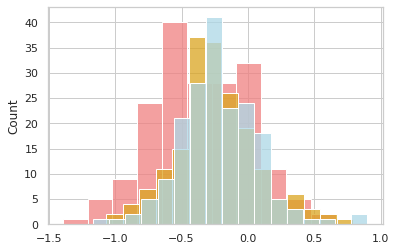

In [186]:
sns.histplot(np.squeeze(diff.loc[['P01330']].to_numpy()), color='lightcoral')
sns.histplot(np.squeeze(diff.loc[['P00914']].to_numpy()), color='goldenrod')
sns.histplot(np.squeeze(diff.loc[['P02332']].to_numpy()), color='lightblue')

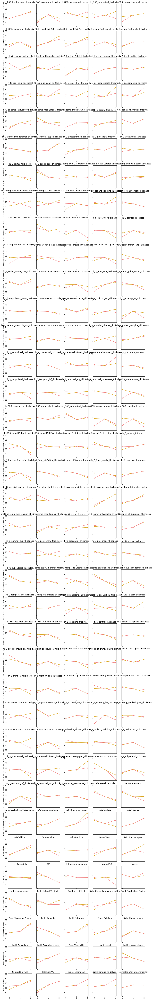

In [126]:
nrows = 37
ncols = 5
fig,ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3,nrows*3))
for i, idp in enumerate(idp_ids):
    
    sns.lineplot(range(0,3), v1_clin.loc[idp],ax=ax[i//ncols,i%ncols], color='goldenrod')
    sns.scatterplot(range(0,3), v1_clin.loc[idp],ax=ax[i//ncols,i%ncols], color='goldenrod')
    
    sns.lineplot(range(0,3), v2_clin.loc[idp],ax=ax[i//ncols,i%ncols], color='lightcoral')
    sns.scatterplot(range(0,3), v2_clin.loc[idp],ax=ax[i//ncols,i%ncols], color='lightcoral')

    ax[i//ncols,i%ncols].set_title(idp)
    ax[i//ncols,i%ncols].set(ylim=(45,90))
plt.tight_layout()

**Comparison on deviations long vs cs**

In [179]:
# controls
c_dif_long = (controls_long.sel(var_type='models', var='GAF', preproc='z_orig',visit='v2') - controls_long.sel(var_type='models', var='GAF', preproc='z_orig',visit='v1')).to_pandas().stack()
c_dif_long = pd.DataFrame(c_dif_long)
c_dif_long['preprocessing'] = 'longitudinal'
c_dif_long['group'] = 'controls'

c_dif_cs = (controls_cs.sel(var_type='models', var='GAF', preproc='z_orig',visit='v2') - controls_cs.sel(var_type='models', var='GAF', preproc='z_orig',visit='v1')).to_pandas().stack()
c_dif_cs = pd.DataFrame(c_dif_cs)
c_dif_cs['preprocessing'] = 'cross-sectional'
c_dif_cs['group'] = 'controls'

to_plot1 = pd.concat([c_dif_long,c_dif_cs])
to_plot1.reset_index(inplace=True)

# patients
p_dif_long = (patients_long.sel(var_type='models', var='GAF', preproc='z_orig',visit='v2') - patients_long.sel(var_type='models', var='GAF', preproc='z_orig',visit='v1')).to_pandas().stack()
p_dif_long = pd.DataFrame(p_dif_long)
p_dif_long['preprocessing'] = 'longitudinal'
p_dif_long['group'] = 'patients'

p_dif_cs = (patients_cs.sel(var_type='models', var='GAF', preproc='z_orig',visit='v2') - patients_cs.sel(var_type='models', var='GAF', preproc='z_orig',visit='v1')).to_pandas().stack()
p_dif_cs = pd.DataFrame(p_dif_cs)
p_dif_cs['preprocessing'] = 'cross-sectional'
p_dif_cs['group'] = 'patients'

to_plot2 = pd.concat([p_dif_long, p_dif_cs])
to_plot2.reset_index(inplace=True)

to_plot = pd.concat([to_plot1, to_plot2])
to_plot.reset_index(inplace=True)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


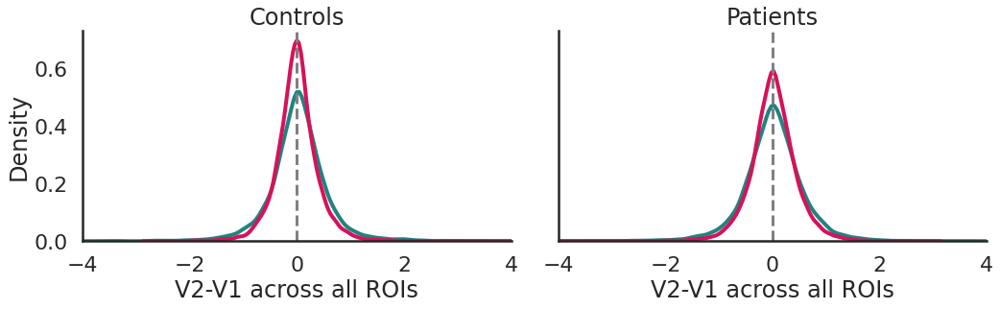

In [198]:
ColdHot_r = ListedColormap([*pk1,*pk2])

sns.set_theme(style='white')
sns.set_context("poster")

cobra_colors = ["#D81159","#218380", "#FFDD00"]
# Set your custom color palette
cobra_colors = sns.set_palette(sns.color_palette(cobra_colors))

fig, ax = plt.subplots(1,2,figsize=(15,5), sharey=True)
sns.kdeplot(data=to_plot1, x=0, hue='preprocessing', ax=ax[0], linewidth=4)
ax[0].set_xlabel('V2-V1 across all ROIs')
ax[0].set_title('Controls')
ax[0].legend(frameon=False)
ax[0].axvline(0, color='grey', linestyle='--')
ax[0].set(xlim=(-4,4))

sns.kdeplot(data=to_plot2, x=0, hue='preprocessing', ax=ax[1], linewidth=4)
ax[1].set_xlabel('V2-V1 across all ROIs')
ax[1].set_title('Patients')
ax[1].legend(frameon=False)
ax[1].axvline(0, color='grey', linestyle='--')
ax[1].set(xlim=(-4,4))

plt.tight_layout()

#sns.despine(fig=None, ax=None, top=False, right=False, left=False, bottom=False, offset=None, trim=False)
sns.despine()


plt.savefig('/home/barbora/Documents/Projects/Normative_Models/ESO/OHBM_poster/c_p_diff.png', dpi=300, transparent=True)




In [184]:
cobra_colors = ['#00FDDC',"#FFDD00", '#001524',"#D81159",  '#001524',"#218380",]
# Set your custom color palette
cobra_colors = sns.set_palette(sns.color_palette(cobra_colors))

sns.set_context("poster")

fig = plt.figure(figsize=(7, 5))
p = sns.kdeplot(data=all_diff, x=idp_ids[0], hue='site')

lss = [':', '--', '-.', '-']

handles = p.legend_.legendHandles[::-1]

for line, ls, handle in zip(p.lines, lss, handles):
    line.set_linestyle(ls)
    handle.set_ls(ls)

p.legend(frameon=False)
p.set_title('V2 - V1 across sites \n controls')
sns.despine()
plt.tight_layout()
plt.savefig('/home/barbora/Documents/Projects/Normative_Models/ESO/OHBM_poster/sites_variance_new.png', dpi=300, transparent=True)

In [212]:
v1_gaf = pd.DataFrame(patients_long.sel(var='GAF', preproc='z_orig',visit='v1', roi=idp_ids[0], var_type='clin').to_pandas().astype(float))
v1_gaf['visit']='v1'
v2_gaf = pd.DataFrame(patients_long.sel(var='GAF', preproc='z_orig',visit='v2', roi=idp_ids[0], var_type='clin').to_pandas().astype(float))
v2_gaf['visit']='v2'

gaf = pd.concat([v1_gaf,v2_gaf], axis=0)
tab = kruskal(data=gaf, dv=0, between='visit')

In [39]:
from pingouin import kruskal
from pingouin import ttest

pvals = np.zeros([len(idp_ids),2])

visits_list=['v1','v2']

for idx, visit in enumerate(visits_list):
    #visit = 'v1'
    for i, idp in enumerate(idp_ids):

        t1 = pd.DataFrame(patients_long.sel(var_type='models', var='GAF', preproc='z_orig',visit=visit, roi=idp).to_pandas())
        t1 = t1.astype('float64')
        t1.columns=[idp]
        t1['group'] = 'patients'

        t2 = pd.DataFrame(controls_long.sel(var_type='models', var='GAF', preproc='z_orig',visit=visit, roi=idp).to_pandas())
        t2 = t2.astype('float64')
        t2.columns=[idp]
        t2['group'] = 'controls'

        temp = pd.concat([t1,t2])

        # extract p-value
        tab = kruskal(data=temp, dv=idp, between='group')
        #tab['p-unc'].to_numpy()

        if temp.groupby('group').agg('mean').iloc[1,0] < temp.groupby('group').agg('mean').iloc[0,0]:
            pvals[i,idx] = tab['p-unc'].to_numpy()[0]*-1
        else:
            pvals[i,idx] = tab['p-unc'].to_numpy()[0]

        #tab = ttest(temp[temp['group']=='patients'][idp], temp[temp['group']=='controls'][idp])
        #pvals[i,idx] = tab['p-val'].to_numpy()[0]

        

In [101]:
pvals_to_plot = pd.DataFrame(pvals[:,0], index=idp_ids, columns=['var'])

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pvals_to_plot, 'r', method='pvals')
view = plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_palette, bg_map=fs_sulc, vmin=-0.05, vmax=0.05).save_as_html('/home/barbora/Documents/Projects/Normative_Models/ESO/OHBM_poster/v1_pvals_right.html')

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pvals_to_plot, 'l', method='pvals')
view = plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_palette, bg_map=fs_sulc, vmin=-0.05, vmax=0.05).save_as_html('/home/barbora/Documents/Projects/Normative_Models/ESO/OHBM_poster/v1_pvals_left.html')

/home/barbora/Instalacky/yes/envs/PCN/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')


In [102]:
pvals_to_plot = pd.DataFrame(pvals[:,1], index=idp_ids, columns=['var'])

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pvals_to_plot, 'r', method='pvals')
view = plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_palette, bg_map=fs_sulc, vmin=-0.05, vmax=0.05).save_as_html('/home/barbora/Documents/Projects/Normative_Models/ESO/OHBM_poster/v2_pvals_right.html')

data_mapping, view, fs_plot, fs_sulc = custom.prepare_destrieux_plotting(pvals_to_plot, 'l', method='pvals')
view = plotting.view_surf(fs_plot, data_mapping, threshold=None, cmap=poster_palette, bg_map=fs_sulc, vmin=-0.05, vmax=0.05).save_as_html('/home/barbora/Documents/Projects/Normative_Models/ESO/OHBM_poster/v2_pvals_left.html')

In [99]:
poster_reds = [  '#FFFFFF', '#FDECF2', '#FCD9E6', '#FAC6D9', '#F9B4CD', '#F7A1C0', '#F68EB4', '#F47BA7', '#F3689B', '#F1558E', '#F04282', '#EE2F75', '#ED1D69', '#D81159']
poster_blues = ['#218380', '#25938F', '#29A39F', '#2DB4AF', '#31C4BF', '#3BCEC9', '#5CD6D2', '#7CDEDB', '#9DE7E4', '#ADEBE9', '#BEEFED', '#CEF3F2', '#DEF7F6', '#FFFFFF']

poster_reds.reverse()
poster_blues.reverse()

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
poster_palette = ListedColormap([*poster_blues, *poster_reds])



In [90]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

poster_palette = ListedColormap([  '#FFFFFF', '#FDECF2', '#FCD9E6', '#FAC6D9', '#F9B4CD', '#F7A1C0', '#F68EB4', '#F47BA7', '#F3689B', '#F1558E', '#F04282', '#EE2F75', '#ED1D69', '#D81159',
                    '#218380', '#25938F', '#29A39F', '#2DB4AF', '#31C4BF', '#3BCEC9', '#5CD6D2', '#7CDEDB', '#9DE7E4', '#ADEBE9', '#BEEFED', '#CEF3F2', '#DEF7F6', '#FFFFFF'])

In [24]:
from pingouin import kruskal
pvals = np.zeros([len(idp_ids),2])

visits_list=['v1','v2']

for idx, visit in enumerate(visits_list):
    #visit = 'v1'
    for i, idp in enumerate(idp_ids):

        t1 = pd.DataFrame(patients_cs.sel(var_type='models', var='GAF', preproc='z_orig',visit=visit, roi=idp).to_pandas())
        t1 = t1.astype('float64')
        t1.columns=[idp]
        t1['group'] = 'patients'

        t2 = pd.DataFrame(controls_cs.sel(var_type='models', var='GAF', preproc='z_orig',visit=visit, roi=idp).to_pandas())
        t2 = t2.astype('float64')
        t2.columns=[idp]
        t2['group'] = 'controls'

        temp = pd.concat([t1,t2])

        # extract p-value
        #tab = kruskal(data=temp, dv=idp, between='group')
        #tab['p-unc'].to_numpy()
        #pvals[i,idx] = tab['p-unc'].to_numpy()[0]

        tab = ttest(temp[temp['group']=='patients'][idp], temp[temp['group']=='controls'][idp])
        pvals[i,idx] = tab['p-val'].to_numpy()[0]